In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error

In [2]:
data=pd.read_csv(r"C:\Users\Naveen Reddy\Desktop\Hackathon\TRAIN.csv")
data=data.drop(["ID",'Region_Code'],axis=1)
data["Date"]=pd.to_datetime(data["Date"])
data

,Store_id,Store_Type,Location_Type,Date,Holiday,Discount,#Order,Sales
0,1,S1,L3,2018-01-01,1,Yes,9,7011.84
1,253,S4,L2,2018-01-01,1,Yes,60,51789.12
2,252,S3,L2,2018-01-01,1,Yes,42,36868.20
3,251,S2,L3,2018-01-01,1,Yes,23,19715.16
4,250,S2,L3,2018-01-01,1,Yes,62,45614.52
...,...,...,...,...,...,...,...,...
188335,149,S2,L3,2019-05-31,1,Yes,51,37272.00
188336,153,S4,L2,2019-05-31,1,No,90,54572.64
188337,154,S1,L3,2019-05-31,1,No,56,31624.56
188338,155,S3,L1,2019-05-31,1,Yes,70,49162.41


<AxesSubplot:>

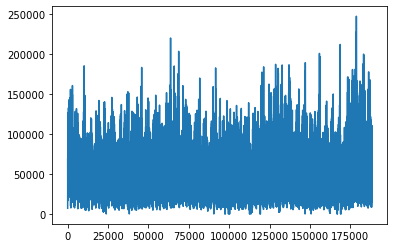

In [3]:
data['Sales'].plot()

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Store_id       188340 non-null  int64         
 1   Store_Type     188340 non-null  object        
 2   Location_Type  188340 non-null  object        
 3   Date           188340 non-null  datetime64[ns]
 4   Holiday        188340 non-null  int64         
 5   Discount       188340 non-null  object        
 6   #Order         188340 non-null  int64         
 7   Sales          188340 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(3), object(3)
memory usage: 11.5+ MB


In [5]:
data

,Store_id,Store_Type,Location_Type,Date,Holiday,Discount,#Order,Sales
0,1,S1,L3,2018-01-01,1,Yes,9,7011.84
1,253,S4,L2,2018-01-01,1,Yes,60,51789.12
2,252,S3,L2,2018-01-01,1,Yes,42,36868.20
3,251,S2,L3,2018-01-01,1,Yes,23,19715.16
4,250,S2,L3,2018-01-01,1,Yes,62,45614.52
...,...,...,...,...,...,...,...,...
188335,149,S2,L3,2019-05-31,1,Yes,51,37272.00
188336,153,S4,L2,2019-05-31,1,No,90,54572.64
188337,154,S1,L3,2019-05-31,1,No,56,31624.56
188338,155,S3,L1,2019-05-31,1,Yes,70,49162.41


In [6]:
categorical=[]
numerical=[]
for i in data.columns:
    if data[str(i)].dtype=='O':
        categorical.append(str(i))
    else:
        numerical.append(str(i))

In [7]:
for i in data.columns:
    print(str(i)+" "+str(len(data[str(i)].unique())))

Store_id 365
Store_Type 4
Location_Type 5
Date 516
Holiday 2
Discount 2
#Order 299
Sales 47422


In [8]:
cato=pd.get_dummies(data[categorical],drop_first=True)

In [9]:
data=data.drop(categorical,axis=1)
data=pd.concat([data,cato],axis=1)
data["Day"]=data["Date"].dt.weekday  
#data["Orders_outliers"]=np.where(data["#Order"]>82,1,0)
data=data.drop("#Order",axis=1)
data

,Store_id,Date,Holiday,Sales,Store_Type_S2,Store_Type_S3,Store_Type_S4,Location_Type_L2,Location_Type_L3,Location_Type_L4,Location_Type_L5,Discount_Yes,Day
0,1,2018-01-01,1,7011.84,0,0,0,0,1,0,0,1,0
1,253,2018-01-01,1,51789.12,0,0,1,1,0,0,0,1,0
2,252,2018-01-01,1,36868.20,0,1,0,1,0,0,0,1,0
3,251,2018-01-01,1,19715.16,1,0,0,0,1,0,0,1,0
4,250,2018-01-01,1,45614.52,1,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,149,2019-05-31,1,37272.00,1,0,0,0,1,0,0,1,4
188336,153,2019-05-31,1,54572.64,0,0,1,1,0,0,0,0,4
188337,154,2019-05-31,1,31624.56,0,0,0,0,1,0,0,0,4
188338,155,2019-05-31,1,49162.41,0,1,0,0,0,0,0,1,4


In [10]:
data

,Store_id,Date,Holiday,Sales,Store_Type_S2,Store_Type_S3,Store_Type_S4,Location_Type_L2,Location_Type_L3,Location_Type_L4,Location_Type_L5,Discount_Yes,Day
0,1,2018-01-01,1,7011.84,0,0,0,0,1,0,0,1,0
1,253,2018-01-01,1,51789.12,0,0,1,1,0,0,0,1,0
2,252,2018-01-01,1,36868.20,0,1,0,1,0,0,0,1,0
3,251,2018-01-01,1,19715.16,1,0,0,0,1,0,0,1,0
4,250,2018-01-01,1,45614.52,1,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,149,2019-05-31,1,37272.00,1,0,0,0,1,0,0,1,4
188336,153,2019-05-31,1,54572.64,0,0,1,1,0,0,0,0,4
188337,154,2019-05-31,1,31624.56,0,0,0,0,1,0,0,0,4
188338,155,2019-05-31,1,49162.41,0,1,0,0,0,0,0,1,4


In [11]:
data.rename(columns={"Date":"ds","Sales":"y"},inplace=True)

In [12]:
X_train=data[:160235]
X_test=data[160235:]


In [13]:
X_train

,Store_id,ds,Holiday,y,Store_Type_S2,Store_Type_S3,Store_Type_S4,Location_Type_L2,Location_Type_L3,Location_Type_L4,Location_Type_L5,Discount_Yes,Day
0,1,2018-01-01,1,7011.84,0,0,0,0,1,0,0,1,0
1,253,2018-01-01,1,51789.12,0,0,1,1,0,0,0,1,0
2,252,2018-01-01,1,36868.20,0,1,0,1,0,0,0,1,0
3,251,2018-01-01,1,19715.16,1,0,0,0,1,0,0,1,0
4,250,2018-01-01,1,45614.52,1,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
160230,165,2019-03-15,0,29883.00,0,0,0,0,0,0,0,0,4
160231,108,2019-03-15,0,40464.00,0,0,0,0,0,0,0,0,4
160232,45,2019-03-15,0,49323.00,0,1,0,0,0,0,0,1,4
160233,365,2019-03-15,0,21150.00,1,0,0,0,0,0,0,0,4


In [14]:
uni=list(X_train["Store_id"].unique())
dat={}
for i in uni:
    dat[i]=X_train[X_train["Store_id"]==i]

In [15]:
uni_test=list(X_test["Store_id"].unique())
dat_test={}
for i in uni_test:
    dat_test[i]=X_test[X_test["Store_id"]==i].drop("y",axis=1)

In [16]:
veri_uni_test=list(X_test["Store_id"].unique())
veri_dat_test={}
for i in veri_uni_test:
    veri_dat_test[i]=X_test[X_test["Store_id"]==i]

In [17]:
dat_test[251]

,Store_id,ds,Holiday,Store_Type_S2,Store_Type_S3,Store_Type_S4,Location_Type_L2,Location_Type_L3,Location_Type_L4,Location_Type_L5,Discount_Yes,Day
160461,251,2019-03-16,0,1,0,0,0,1,0,0,0,5
160617,251,2019-03-17,0,1,0,0,0,1,0,0,0,6
161080,251,2019-03-18,0,1,0,0,0,1,0,0,0,0
161563,251,2019-03-19,0,1,0,0,0,1,0,0,0,1
161794,251,2019-03-20,1,1,0,0,0,1,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
186676,251,2019-05-27,0,1,0,0,0,1,0,0,1,0
187159,251,2019-05-28,0,1,0,0,0,1,0,0,1,1
187388,251,2019-05-29,0,1,0,0,0,1,0,0,0,2
187629,251,2019-05-30,0,1,0,0,0,1,0,0,0,3


**###############**


In [18]:
models={}
for i in dat:
    model=Prophet(interval_width=0.98)
    for j in dat[i].columns:
        if str(j)!="ds" and j!="y" and j!="Store_id":
            model.add_regressor(j)
    model.fit(dat[i].drop("Store_id",axis=1))
    models[i]=model

NameError: name 'Prophet' is not defined

#############

In [ ]:
result={}
for i in dat_test:
    result[i]=models[i].predict(dat_test[i].drop("Store_id",axis=1))

In [ ]:
dataFrame=pd.DataFrame()
dataFrame2=pd.DataFrame()
for i in dat_test:
    dataFrame=pd.concat([dataFrame,dat_test[i]])
for j in result:
    result[j]["Store_id"]=int(j)
    dataFrame2=pd.concat([dataFrame2,result[j]]) 
dataFrame2=dataFrame2[["ds","Store_id","yhat"]]
dataFrame=dataFrame[['ds','Store_id']]

In [ ]:
final=dataFrame2.merge(dataFrame,on=['ds','Store_id'])
nav=X_test[['ds','Store_id','y']]
final=final.merge(nav,on=['ds','Store_id'])
one=final[final['yhat']>0]

In [ ]:
print(mean_squared_log_error(one['y'],one['yhat'])*1000)

# Predictions

In [ ]:
data=pd.read_csv(r"C:\Users\Naveen Reddy\Desktop\Hackathon\TEST_FINAL.csv")
data=data.drop(["ID"],axis=1)
data["Date"]=pd.to_datetime(data["Date"])
data

In [ ]:
categorical=[]
numerical=[]
for i in data.columns:
    if data[str(i)].dtype=='O':
        categorical.append(str(i))
    else:
        numerical.append(str(i))

In [ ]:
cato=pd.get_dummies(data[categorical],drop_first=True)
data=data.drop(categorical,axis=1)
data=pd.concat([data,cato],axis=1)
data["Day"]=data["Date"].dt.weekday   
#data["Orders_outliers"]=np.where(data["#Order"]>82,1,0)
data.rename(columns={"Date":"ds","Sales":"y"},inplace=True)

In [ ]:
data

In [ ]:
uni=data['Store_id'].unique()
test_dat={}
for i in uni:
    test_dat[i]=data[data['Store_id']==i]

In [ ]:
resu={}
for i in test_dat:
    resu[i]=models[i].predict(test_dat[i].drop("Store_id",axis=1))
    

In [ ]:
dataFrame2=pd.DataFrame()
for j in resu:
    resu[j]["Store_id"]=int(j)
    dataFrame2=pd.concat([dataFrame2,resu[j]]) 
dataFrame2=dataFrame2[['ds','Store_id','yhat']]

In [ ]:
dataFrame2

In [ ]:
data=pd.read_csv(r"../input/hackathon/TEST_FINAL.csv")
data["Date"]=pd.to_datetime(data["Date"])
data


In [ ]:
final=data.merge(dataFrame2,left_on=('Date','Store_id'),right_on=('ds','Store_id'))
final=final[['ID','yhat']]
final.columns=['ID','Sales']

In [ ]:
final.to_csv('final20.csv',index=False)

# New Model

In [1]:
!pip install delayed
!pip install auto-ts
from auto_ts import auto_timeseries


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.6.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
tensorflow 2.6.0 requires typing-extensions~=3.7.4, but you have typing-extensions 3.10.0.2 which is incompatible.
streamlit 0.87.0 requires click<8.0,>=7.0, but you have click 8.0.1 which is incompatible.
gensim 4.0.1 requires Cython==0.29.21, but you have cython 0.29.24 which is incompatible.


  Using cached numpy-1.19.5-cp38-cp38-win_amd64.whl (13.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.3
    Uninstalling numpy-1.20.3:
      Successfully uninstalled numpy-1.20.3
Imported auto_timeseries version:0.0.37. Call by using:
model = auto_timeseries(score_type='rmse',
                time_interval='M',
                non_seasonal_pdq=None, seasonality=False, seasonal_period=12,
                model_type=['best'],
                verbose=2)
model.fit(traindata, ts_column,target)
model.predict(testdata, model='best')



Imported auto_timeseries version:0.0.37. Call by using:
model = auto_timeseries(score_type='rmse',
                time_interval='M',
                non_seasonal_pdq=None, seasonality=False, seasonal_period=12,
                model_type=['best'],
                verbose=2)
model.fit(traindata, ts_column,target)
model.predict(testdata, model='best')

Start of Fit.....
Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------------------+
|        Test Statistic       |      -13.56360658726437      |
|           p-value           |    2.285004422220156e-25     |
|          #Lags Used         |             2.0              |
| Number of Observations Used |            436.0             |
|     Critical Value (1%)     |      -3.44543765563

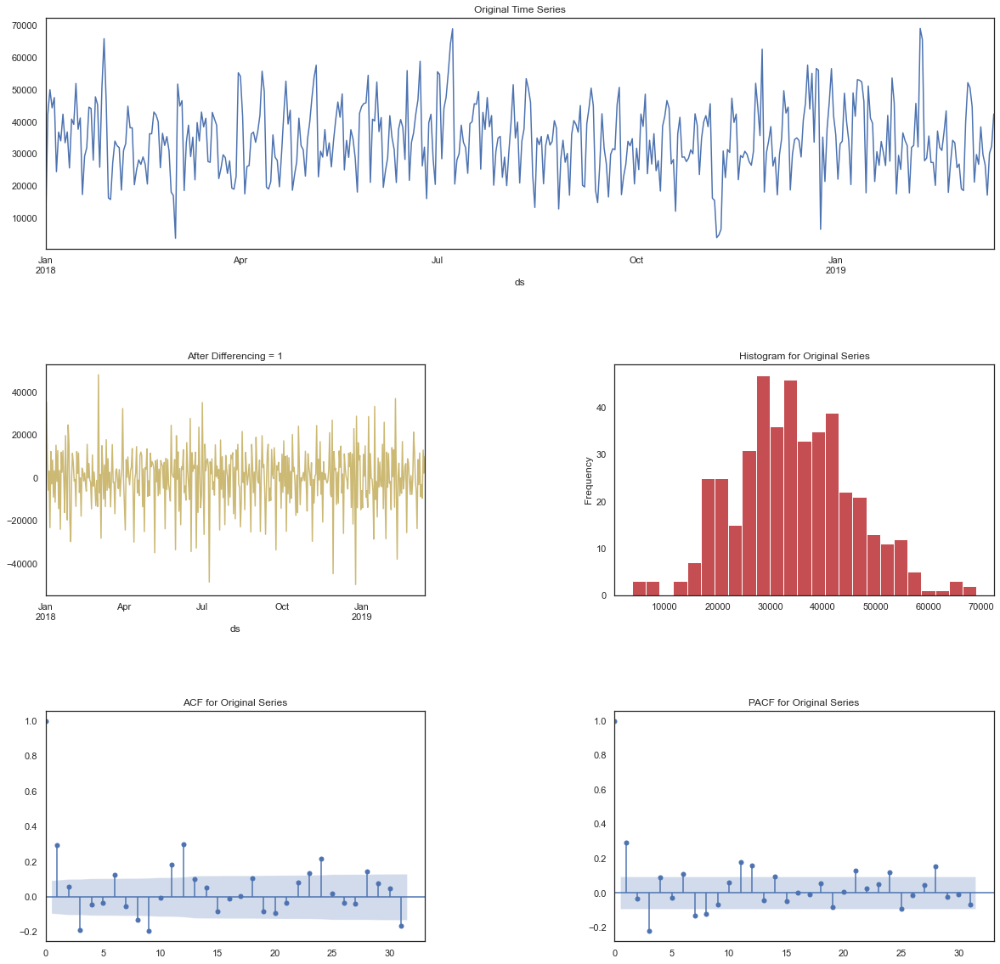

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10785.031, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8685.714, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8687.624, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8687.709, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8687.693, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8684.441, Time=0.52 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8680.677, Time=0.42 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8679.786, Time=0.21 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=

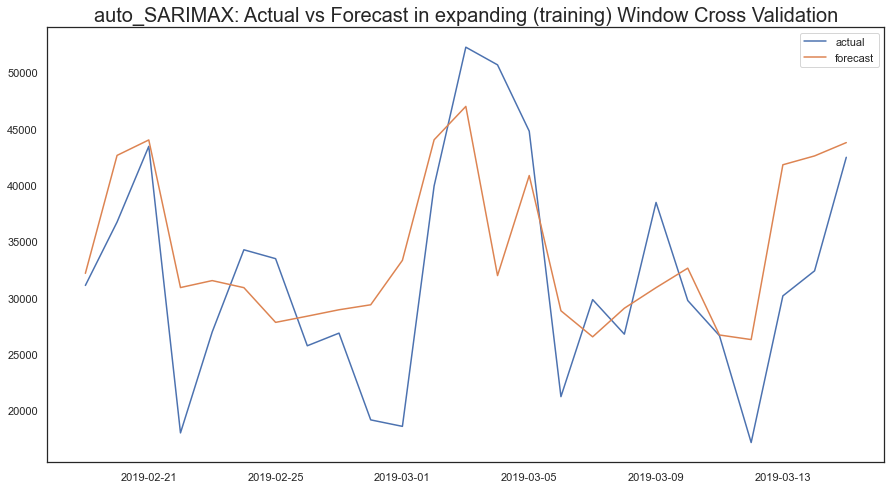

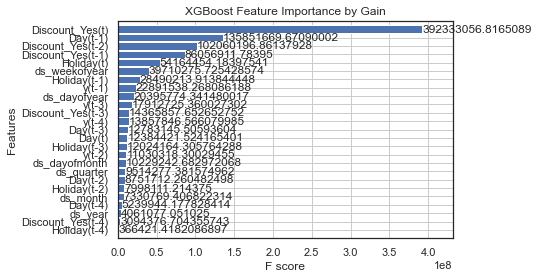

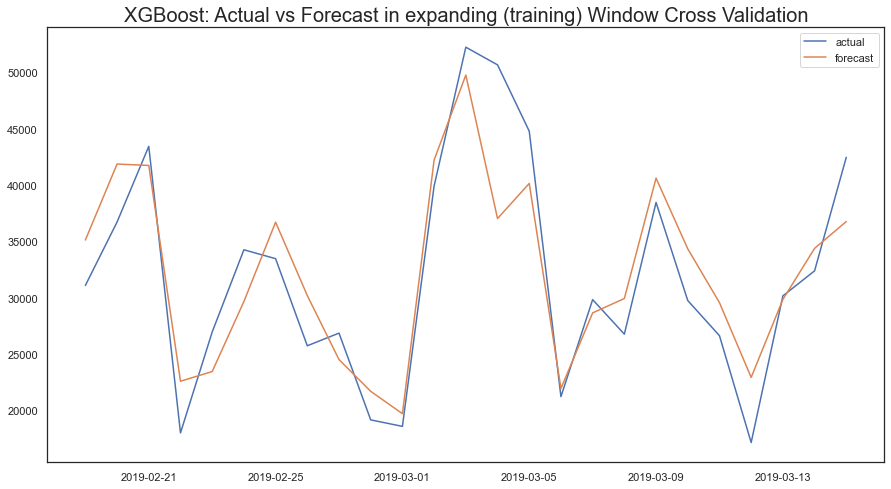

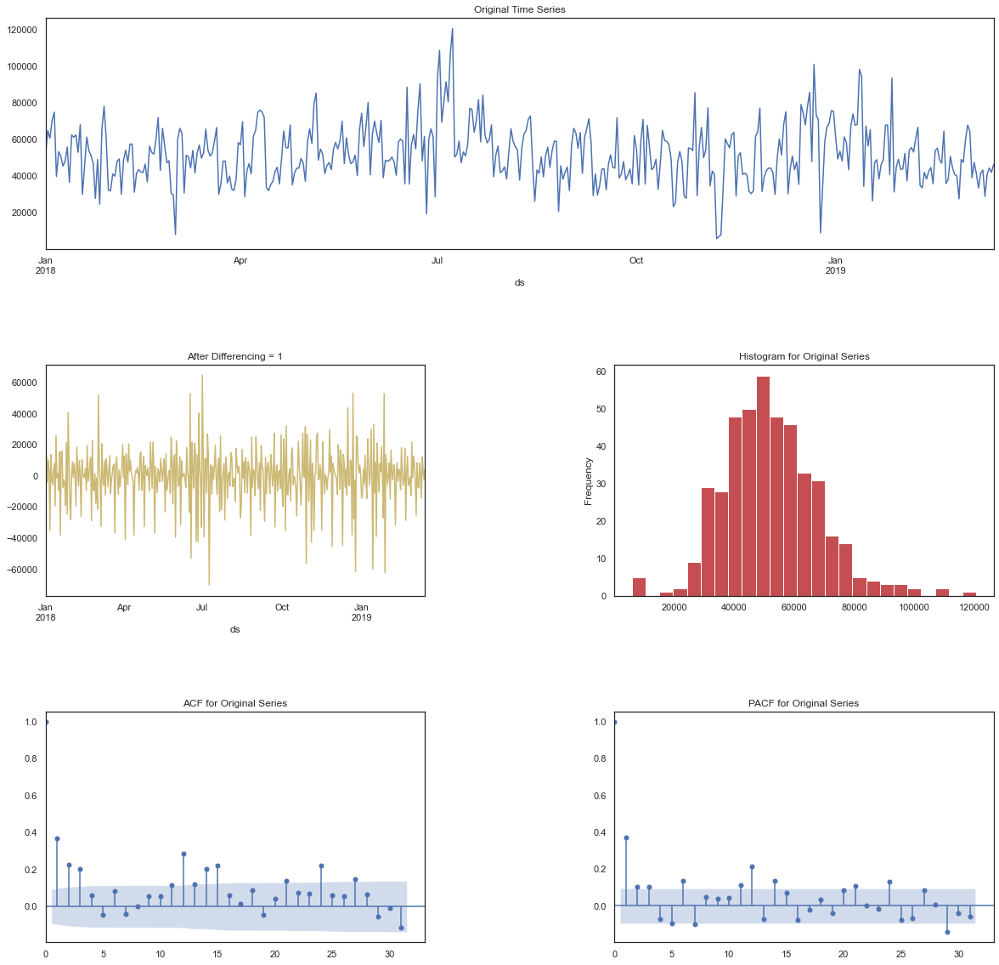

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11084.549, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8956.428, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8968.524, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8948.772, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8944.182, Time=0.15 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8939.769, Time=0.54 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8938.009, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8939.617, Time=0.21 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8941.427, 

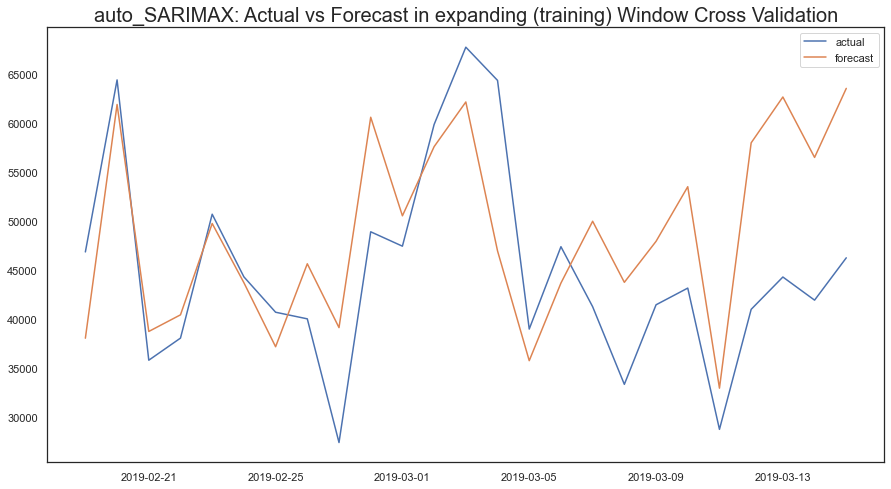

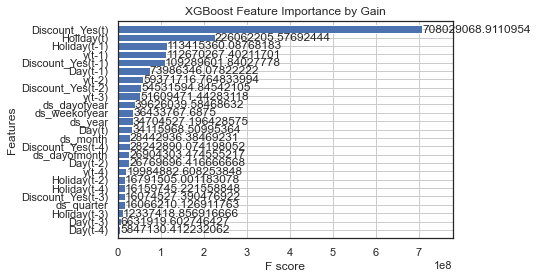

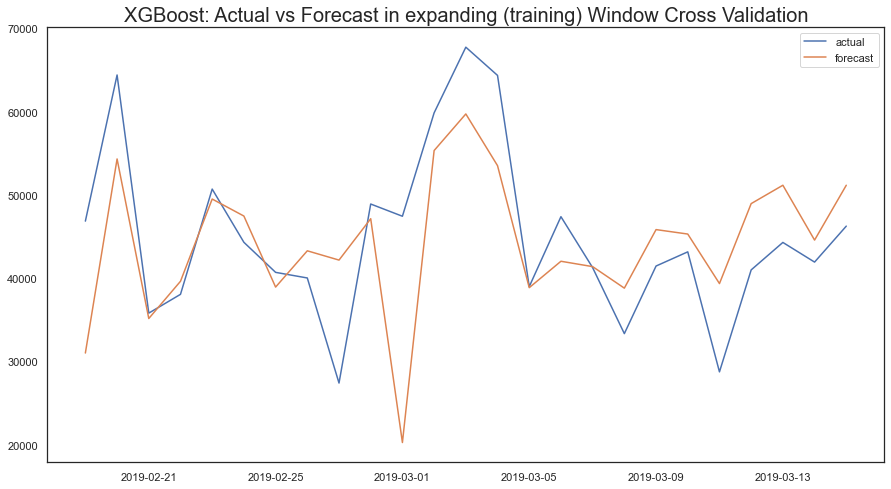

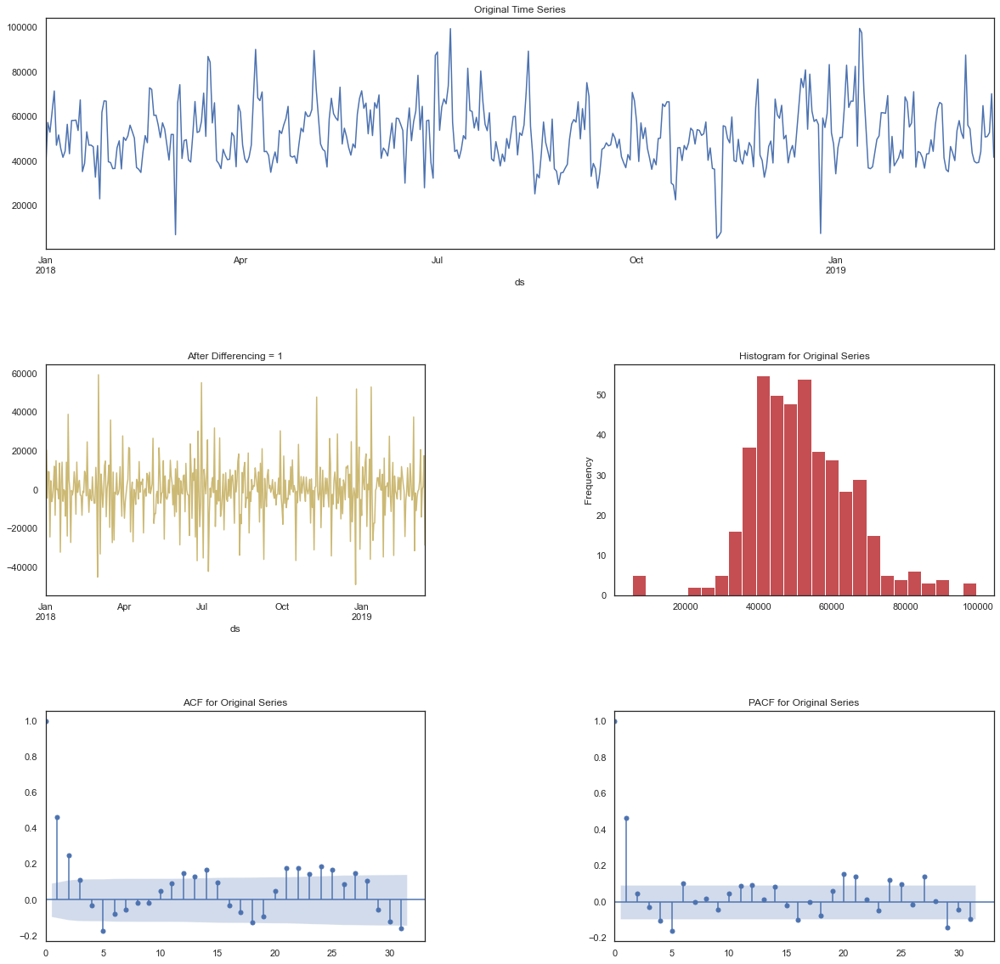

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10933.528, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8778.424, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8794.127, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8778.948, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8779.015, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8780.941, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.604 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

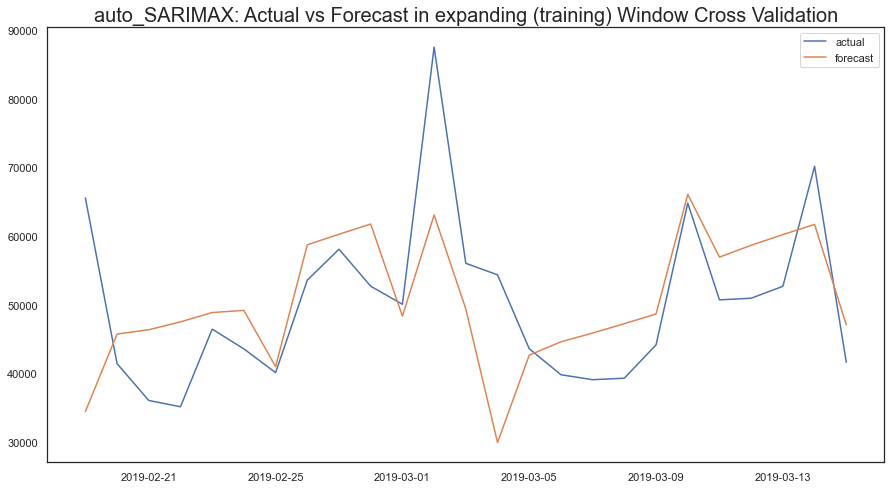

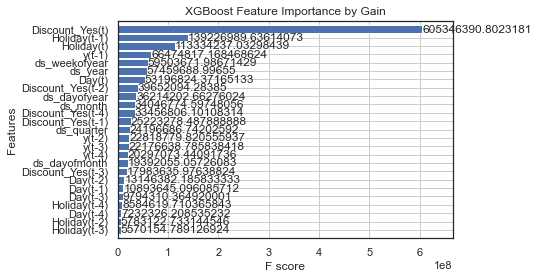

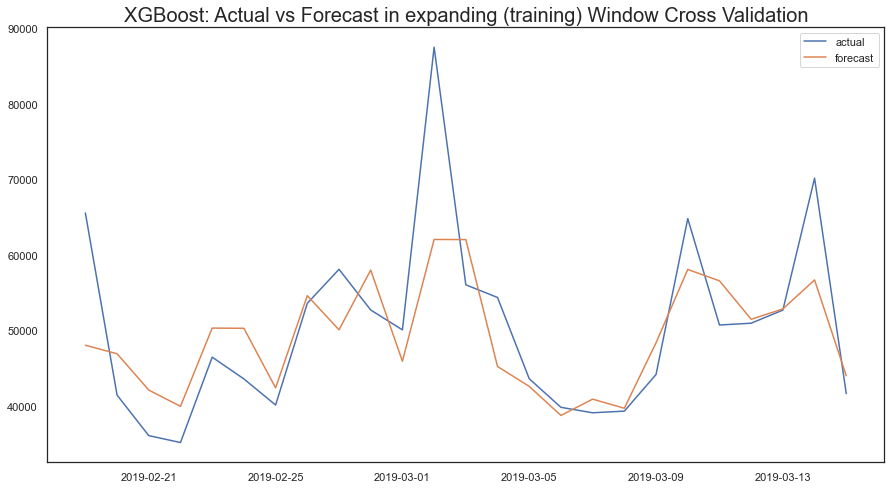

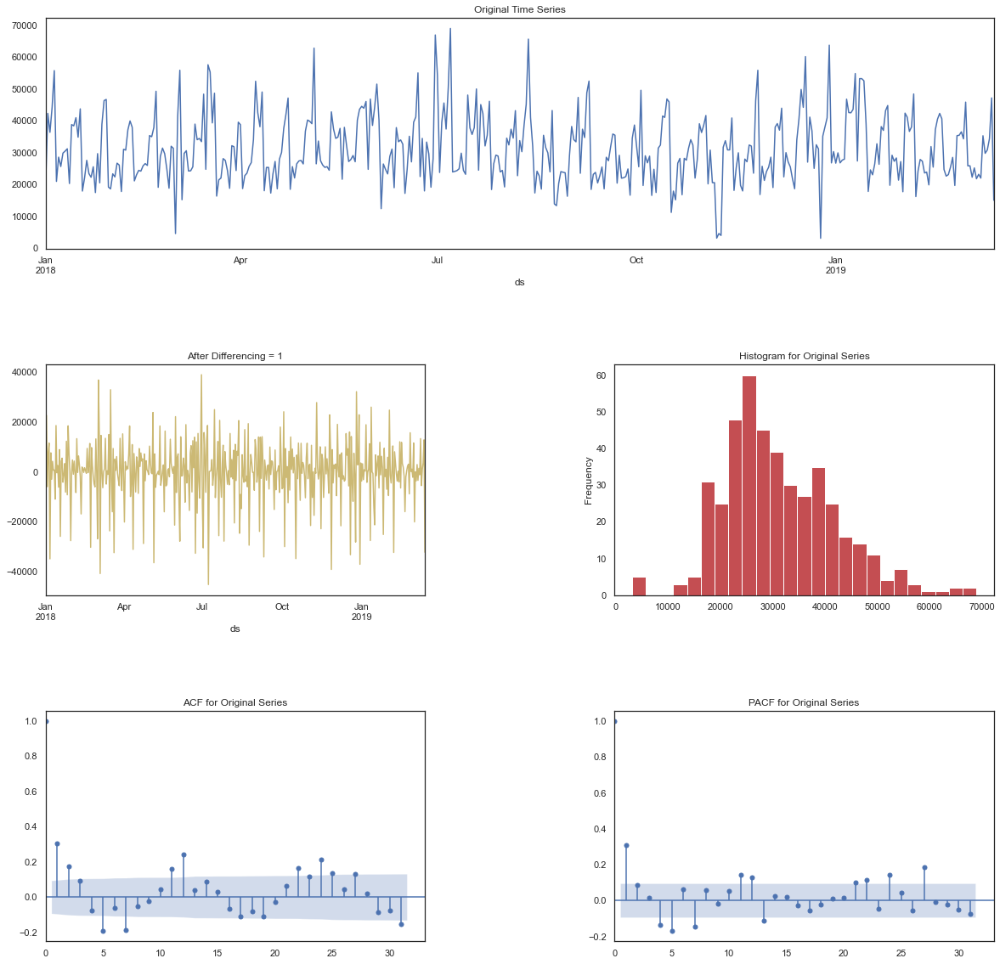

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10657.929, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8549.435, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8554.164, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8548.360, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8549.121, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8549.827, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8547.836, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8549.823, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8551.525, 

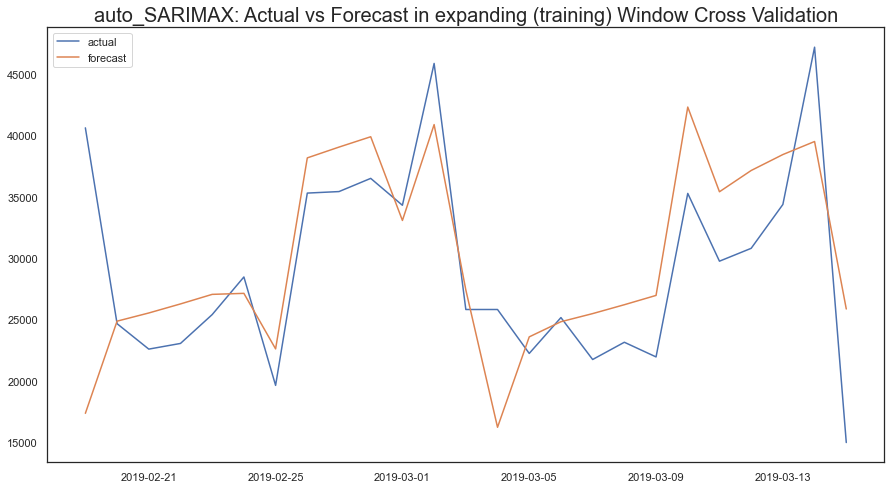

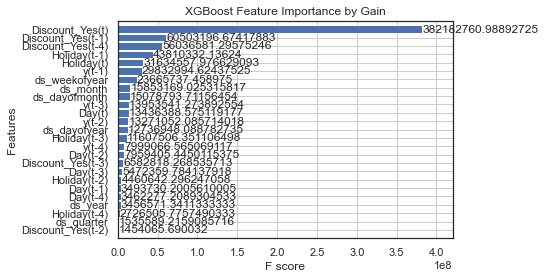

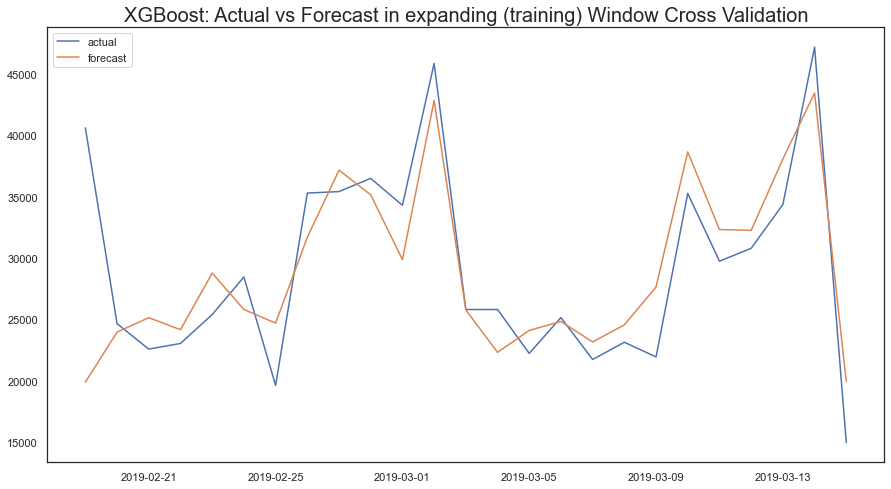

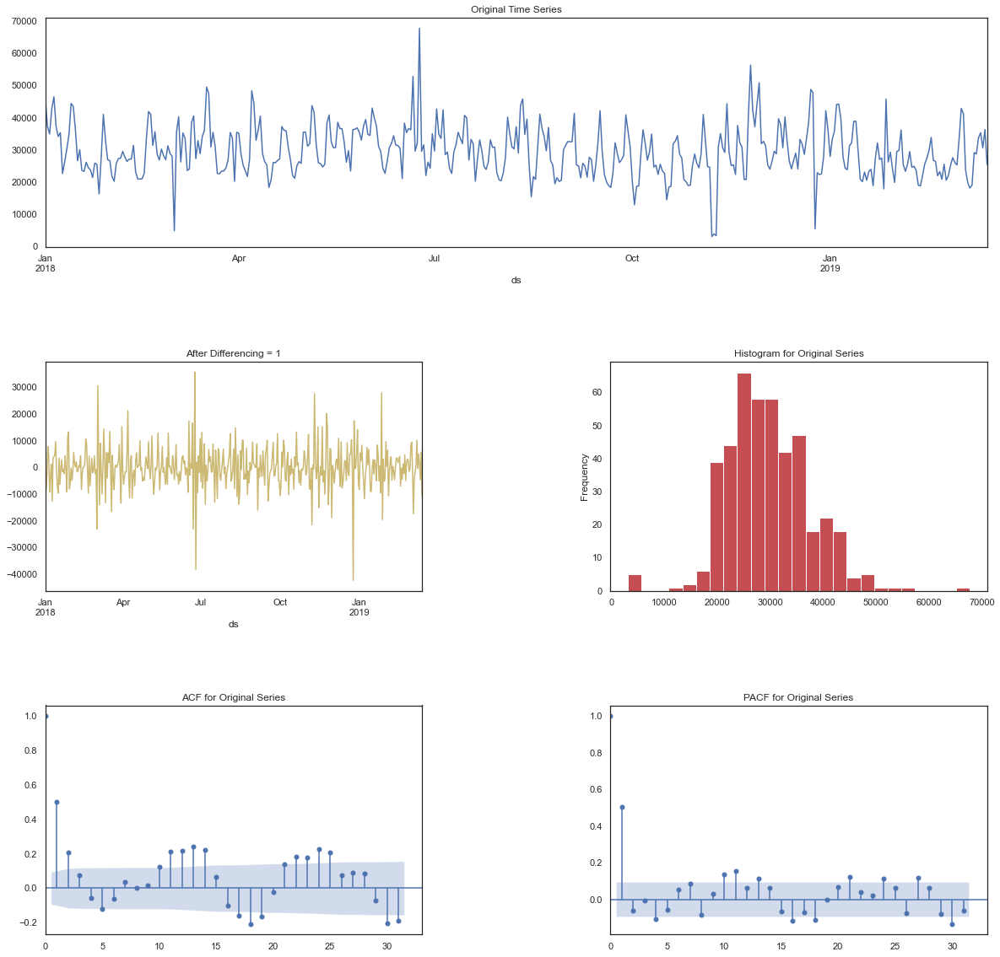

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10548.313, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8403.314, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8410.398, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8405.106, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8405.122, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8407.071, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.942 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

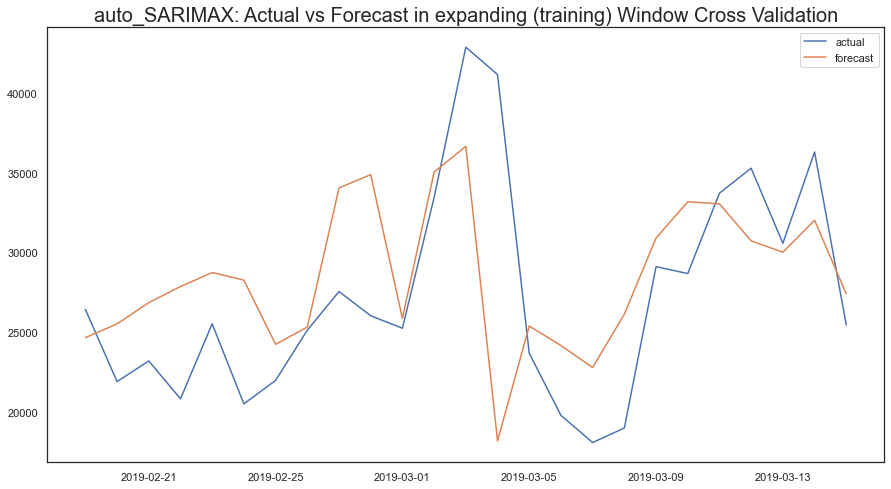

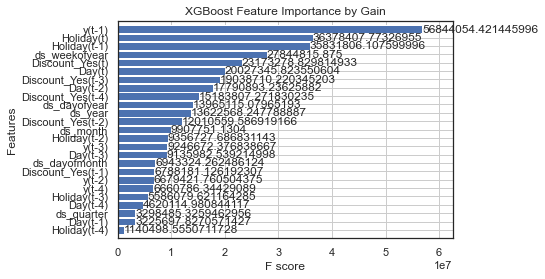

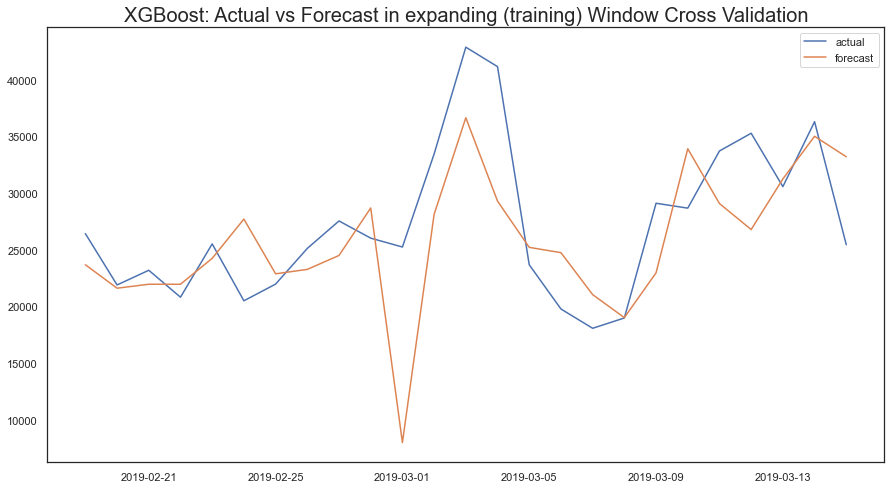

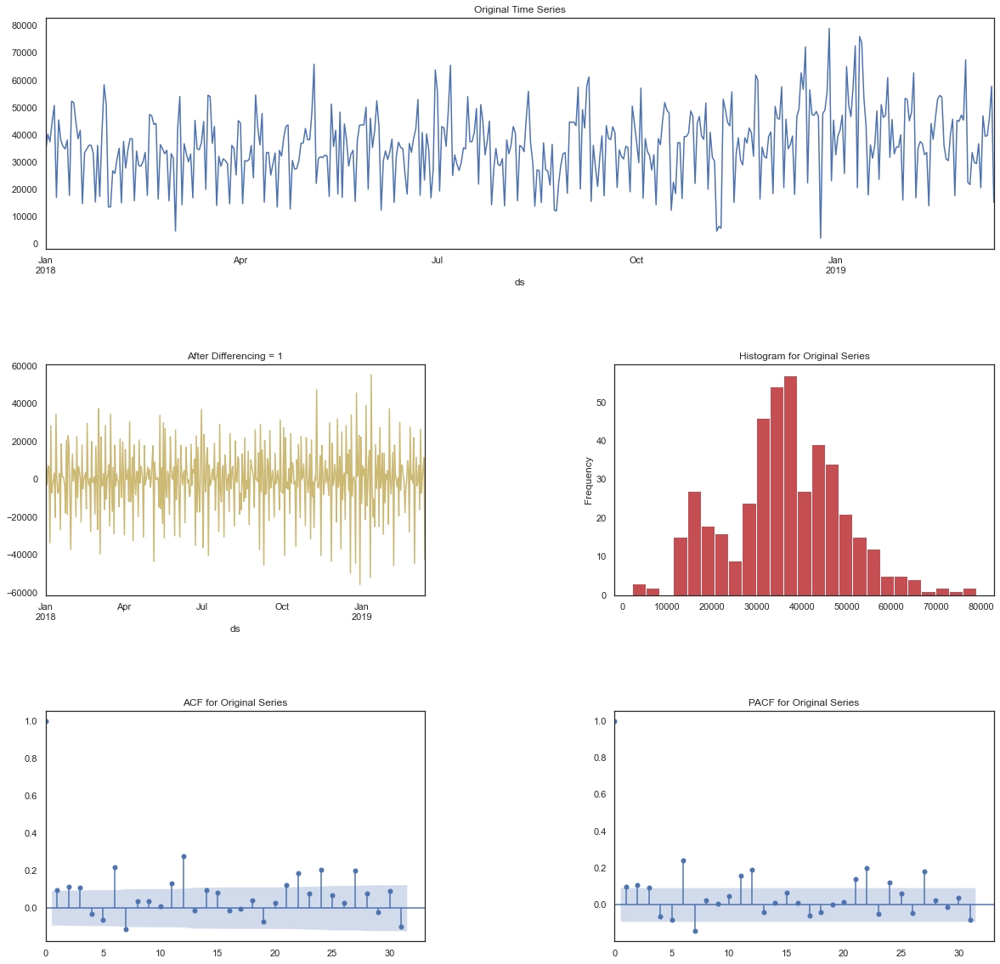

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10905.153, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8815.085, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8817.524, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8807.080, Time=0.11 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8804.130, Time=0.10 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8806.115, Time=0.54 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8788.938, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8787.013, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8788.935, 

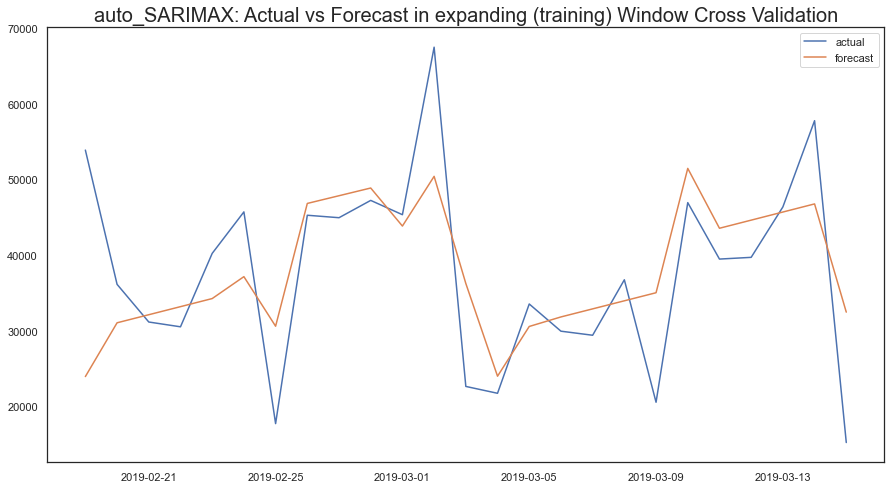

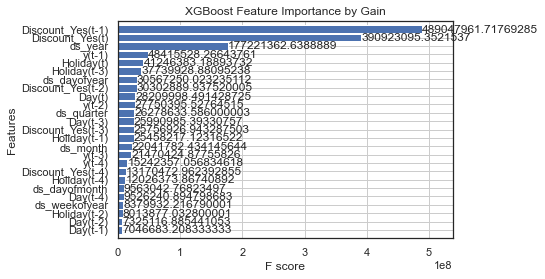

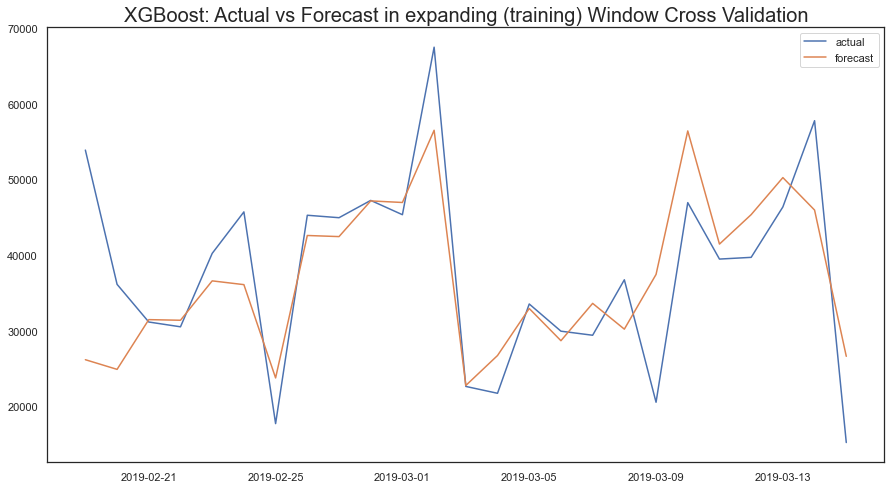

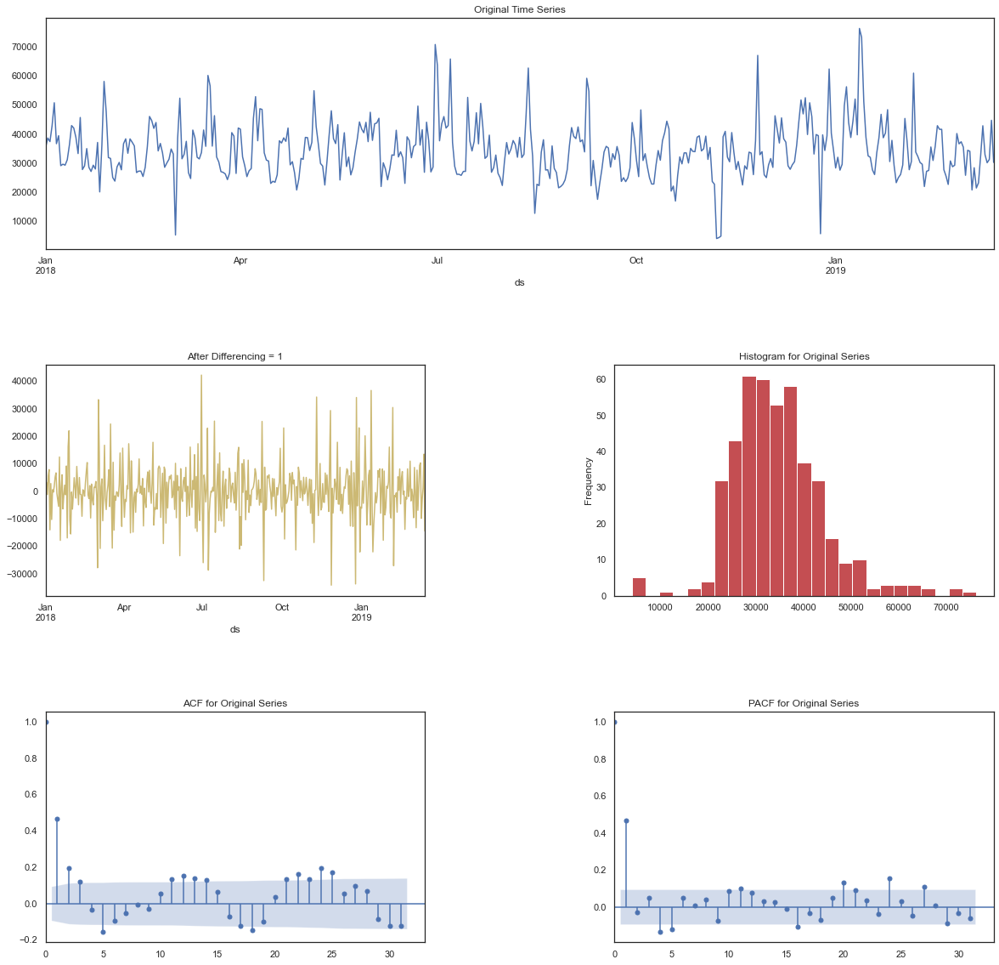

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11271.410, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=9085.103, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9105.395, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9086.039, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9086.523, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9089.303, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8840.278, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=8624.956, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=8977.876, 

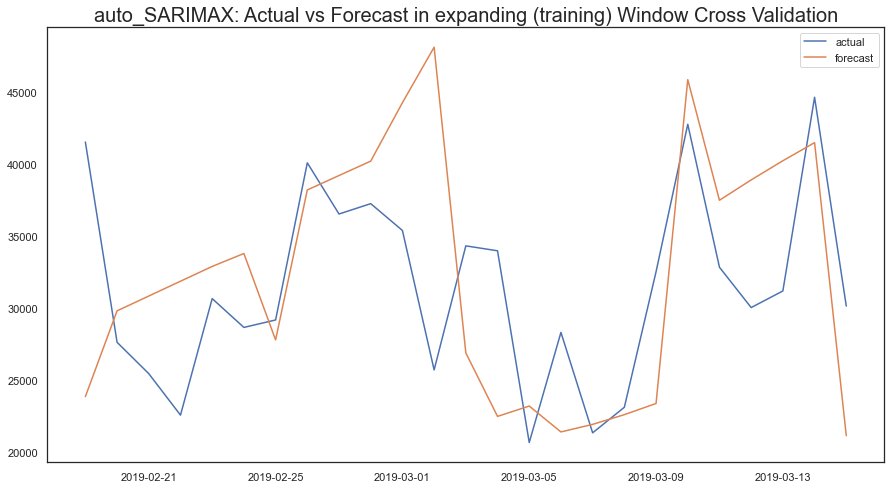

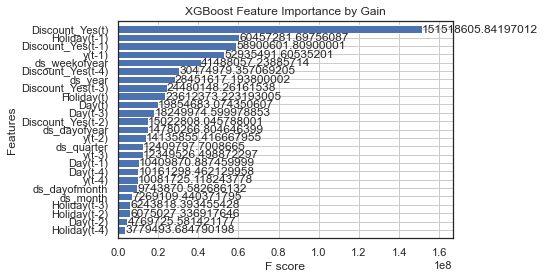

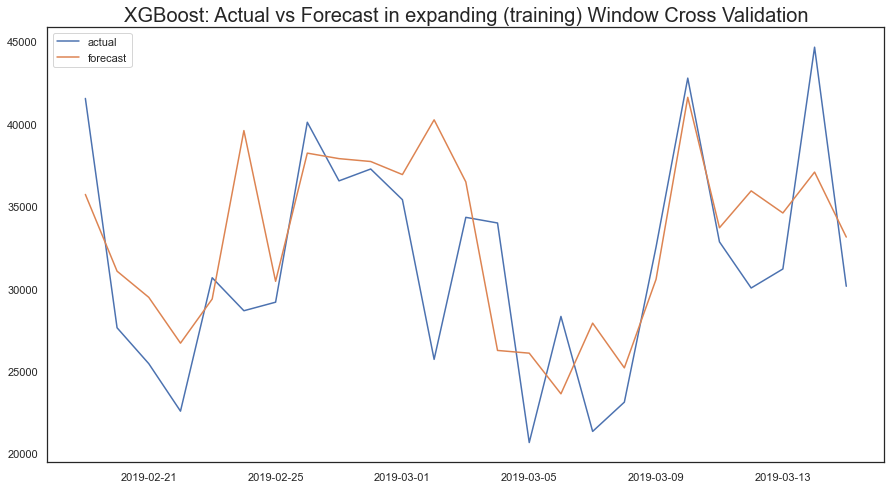

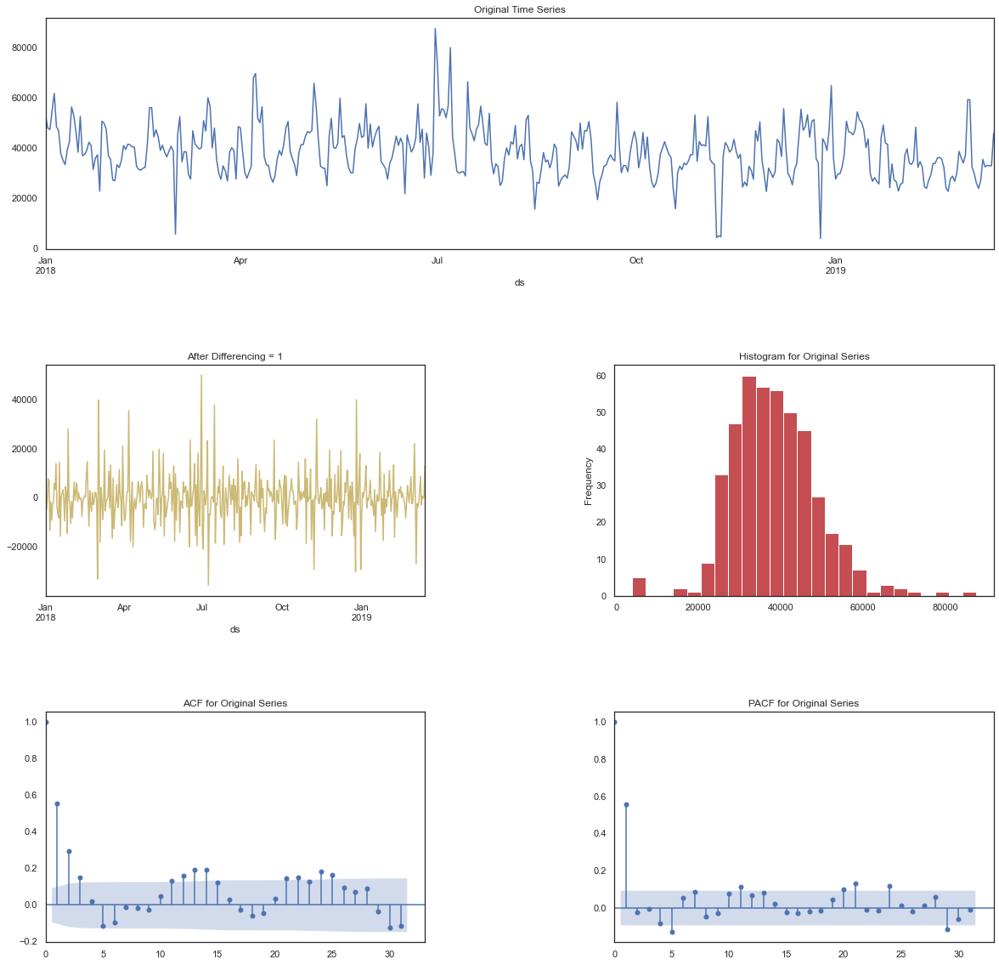

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11369.567, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8818.857, Time=0.88 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9206.424, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9188.177, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9188.343, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9190.583, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8925.882, Time=0.39 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 2.239 seconds

Best model is a Seasonal SARIMAX(1,0,0)*

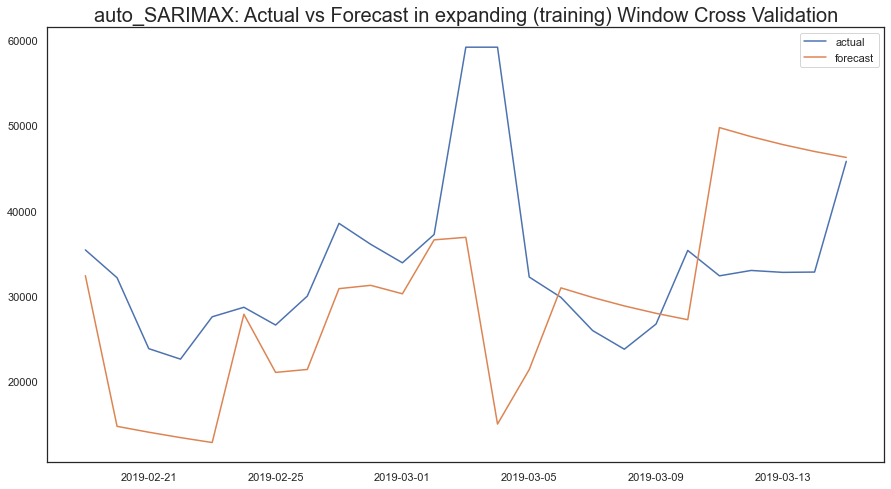

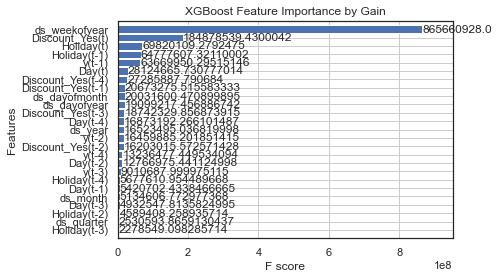

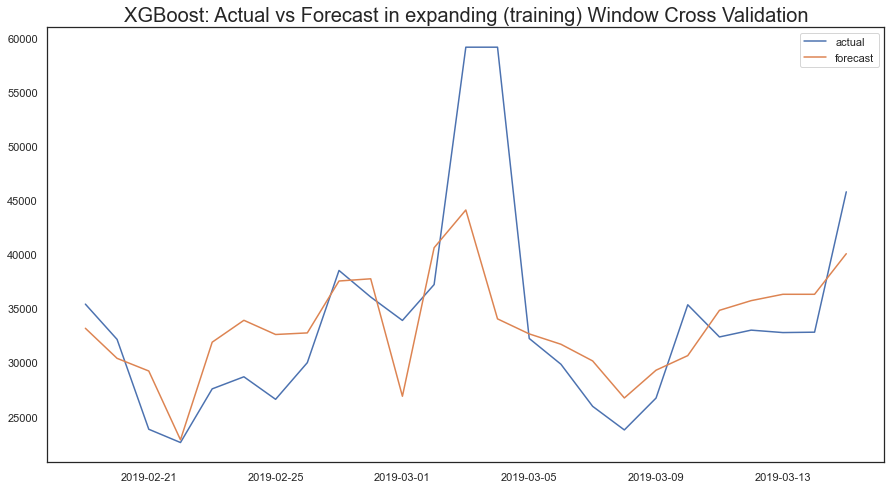

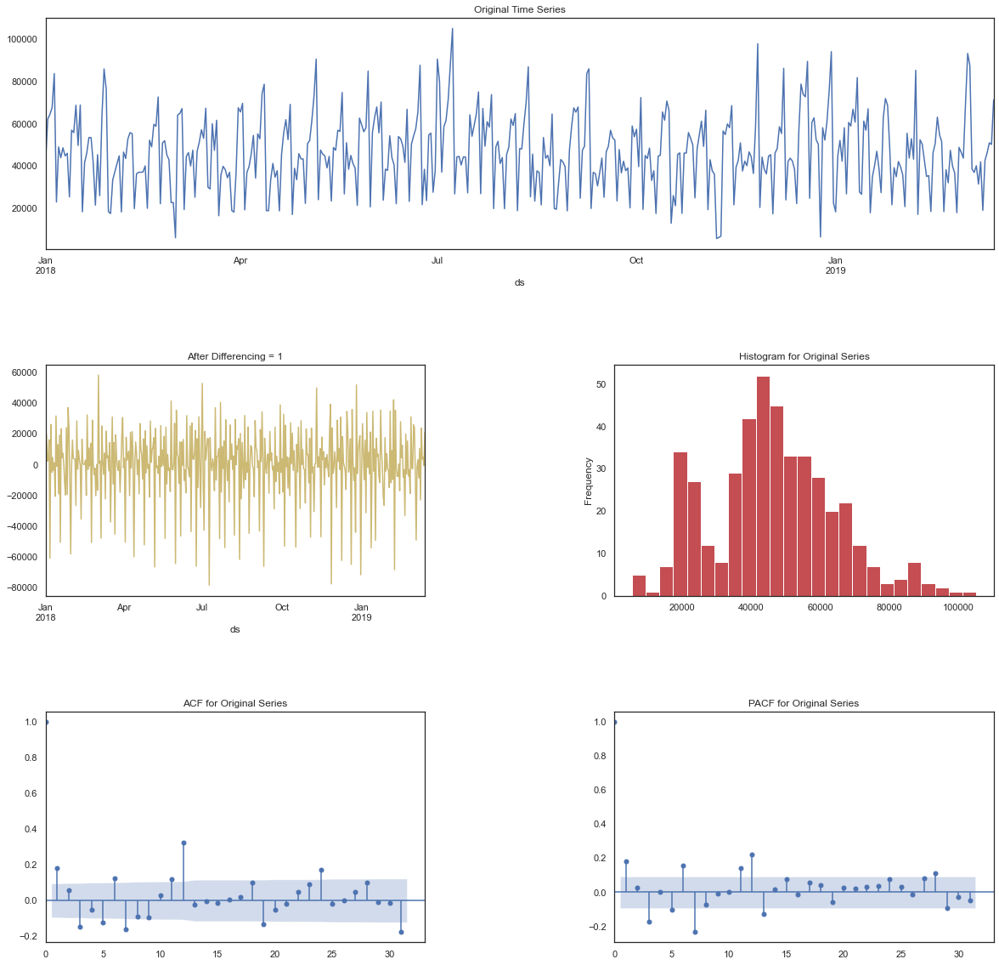

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11106.246, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=9018.261, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9019.052, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9020.029, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9020.201, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9008.616, Time=0.44 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=9014.025, Time=0.32 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8996.203, Time=0.62 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=9007.499, 

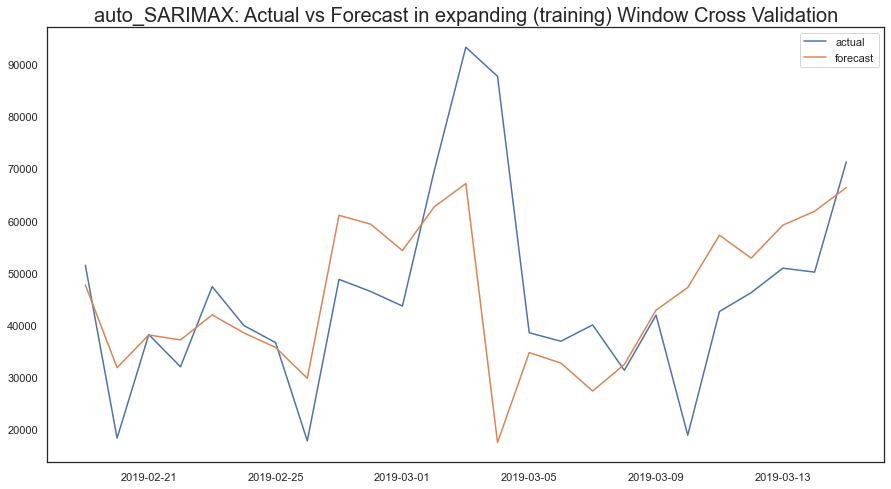

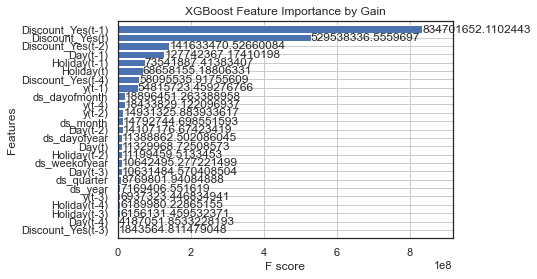

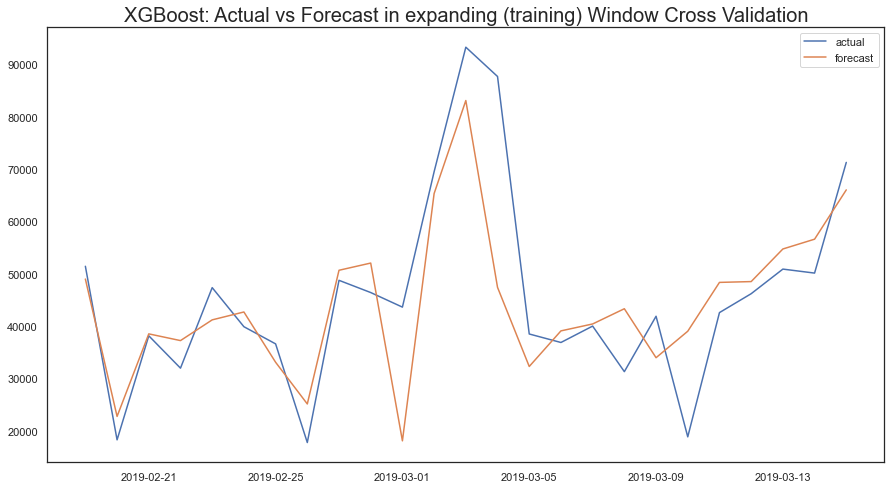

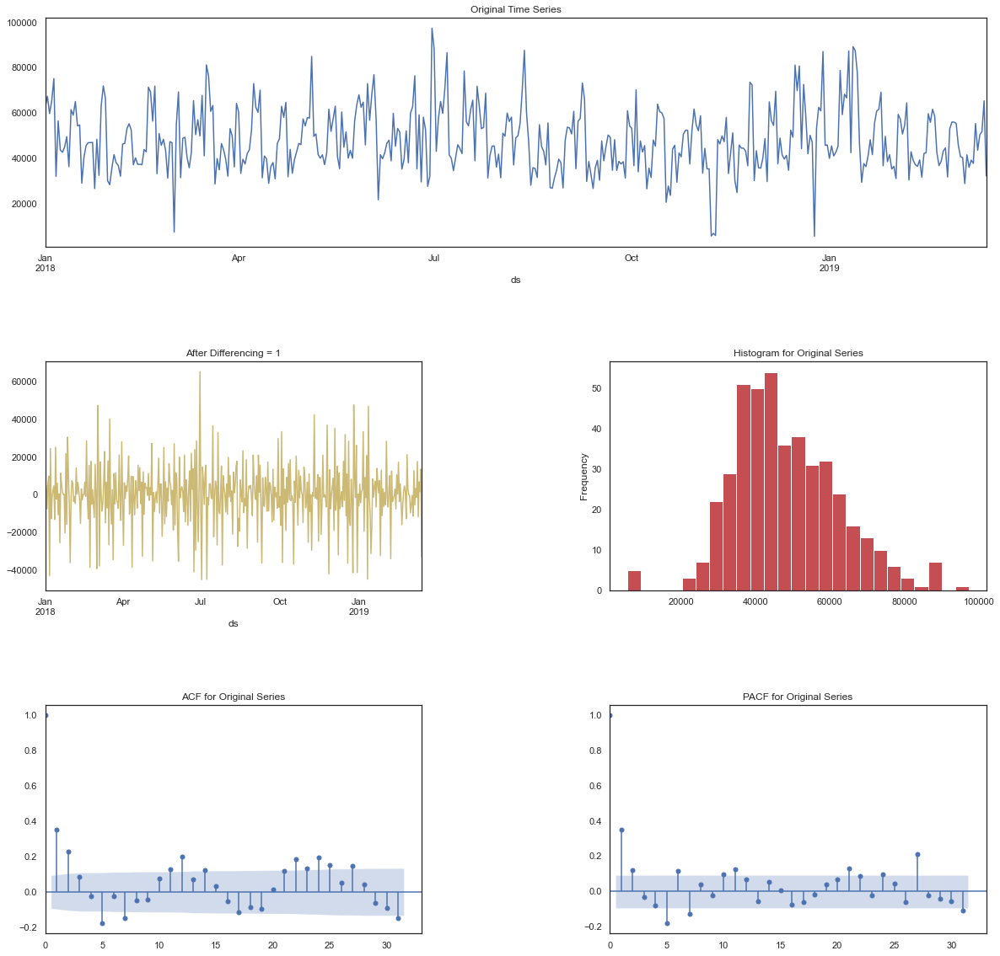

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10940.851, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8820.095, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8828.640, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8818.035, Time=0.10 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8819.721, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8818.030, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8817.526, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8819.383, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8821.872, 

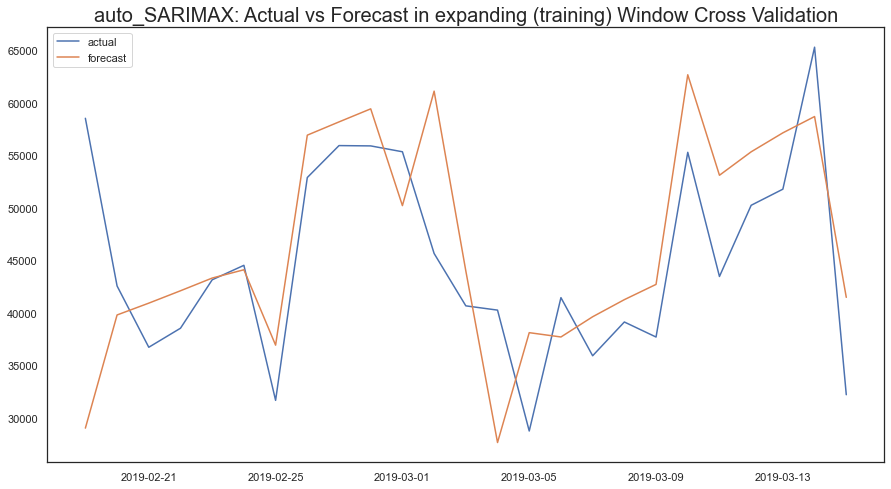

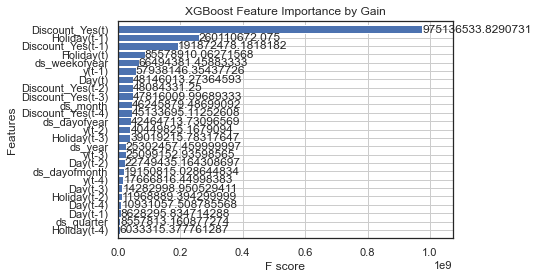

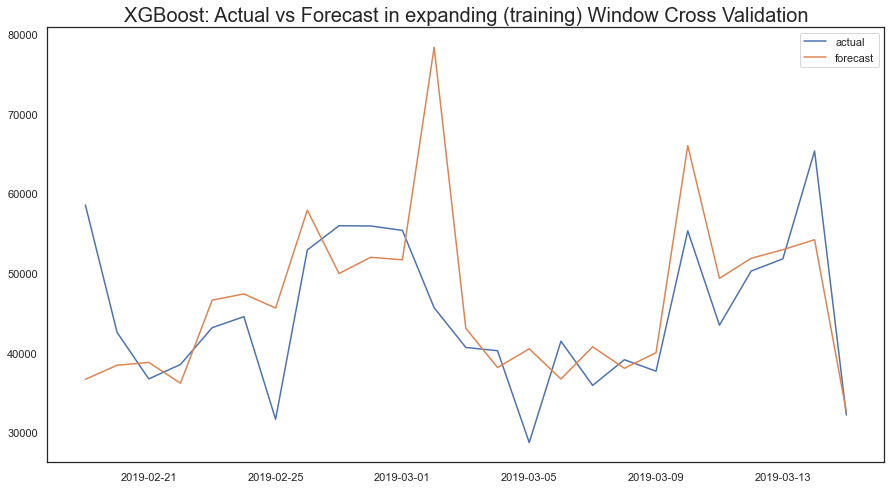

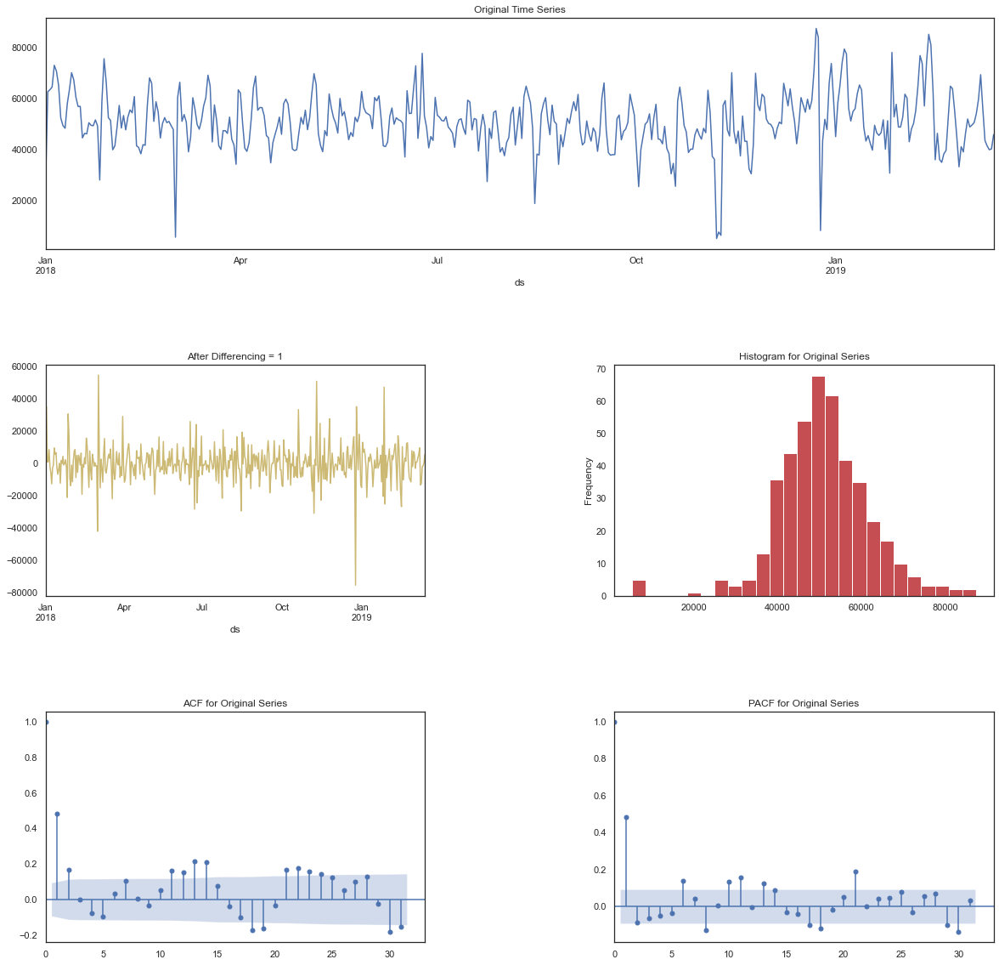

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10857.478, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8702.784, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8716.159, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8704.771, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8704.770, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8706.192, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.932 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

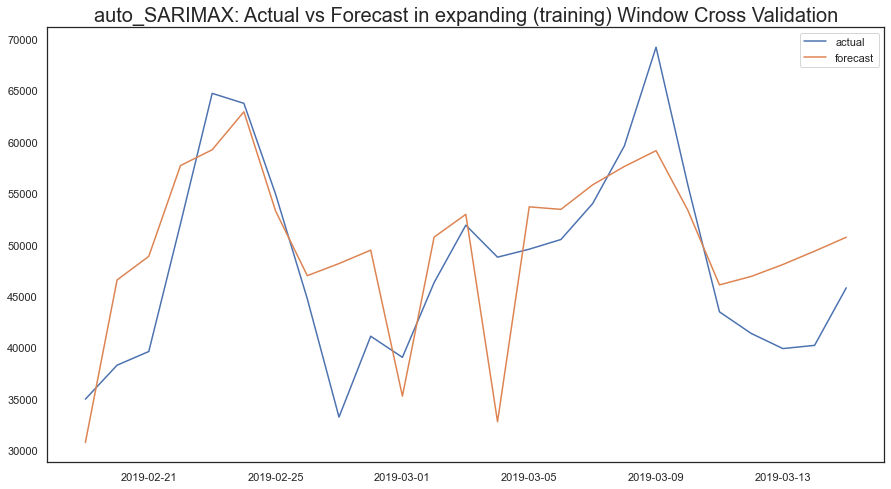

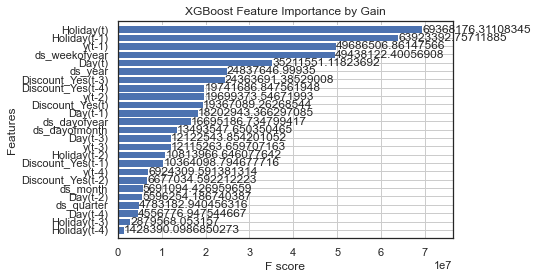

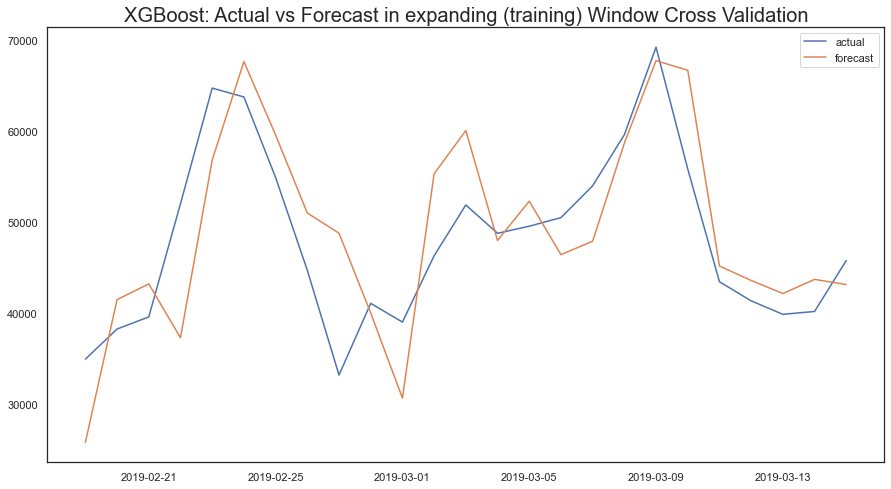

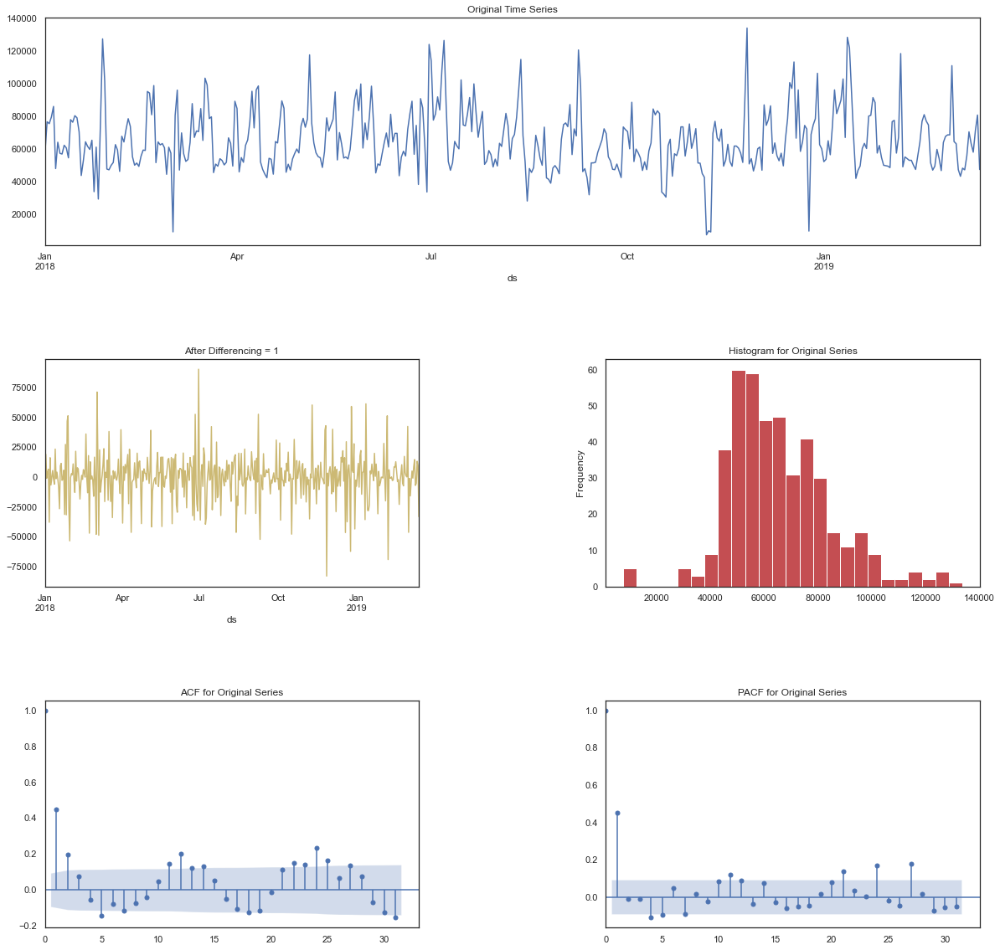

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11195.157, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=9046.542, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9055.599, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9048.546, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9048.560, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9050.559, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.582 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

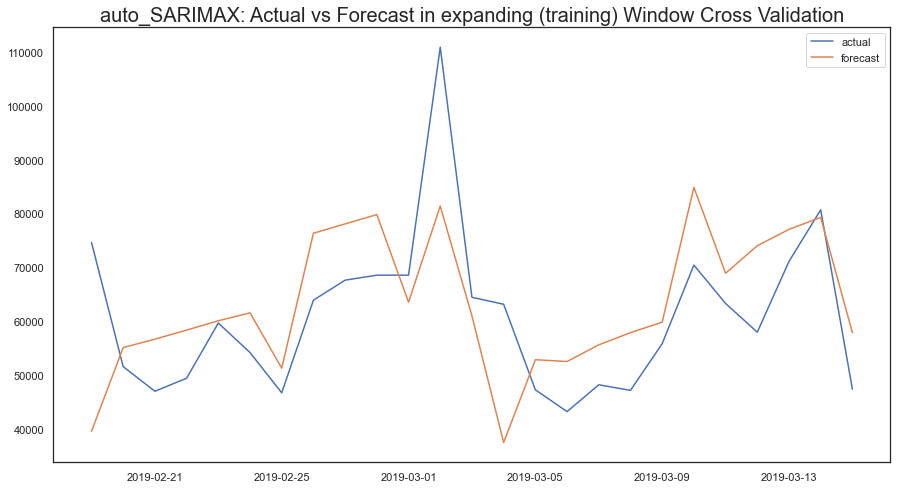

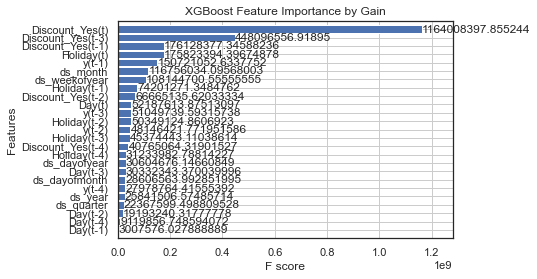

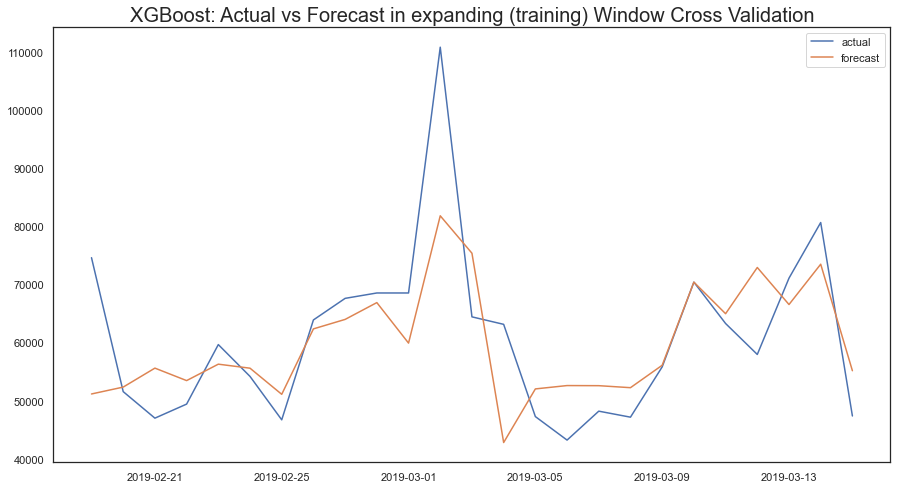

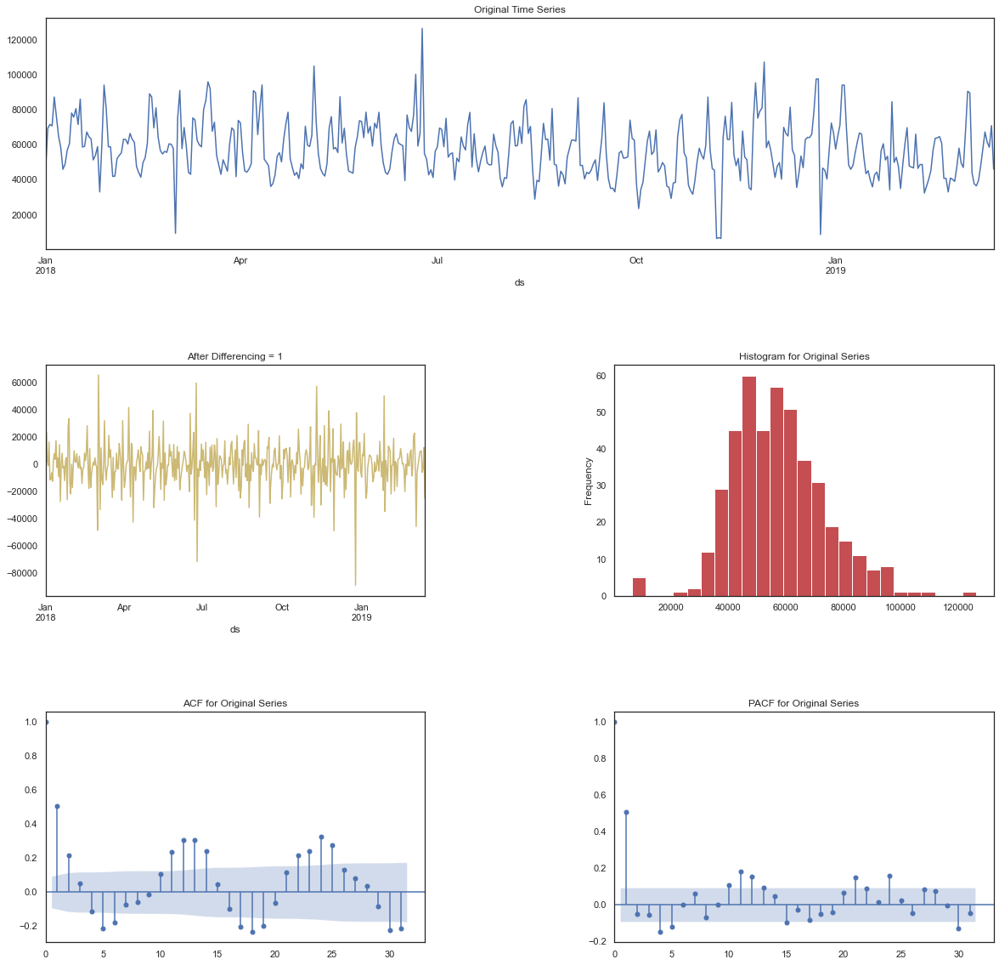

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11095.771, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8955.245, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8963.346, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8957.241, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8957.255, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8959.163, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.935 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

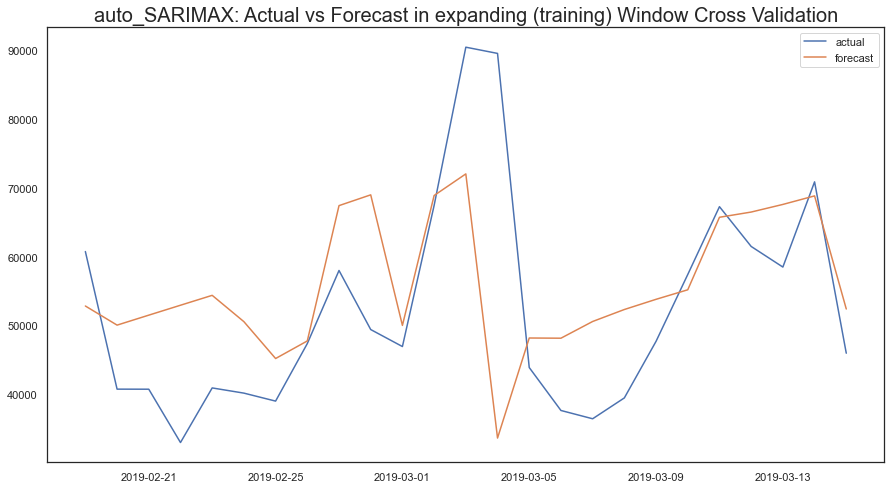

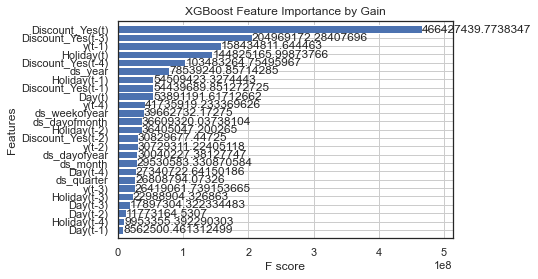

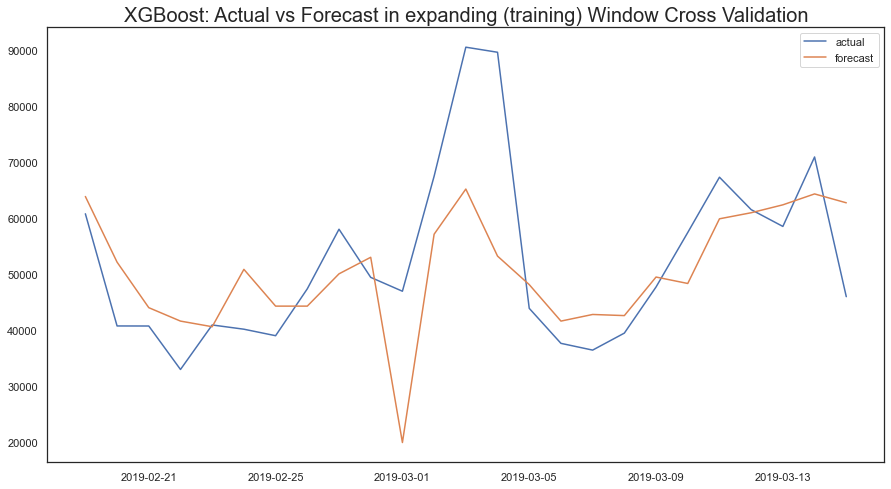

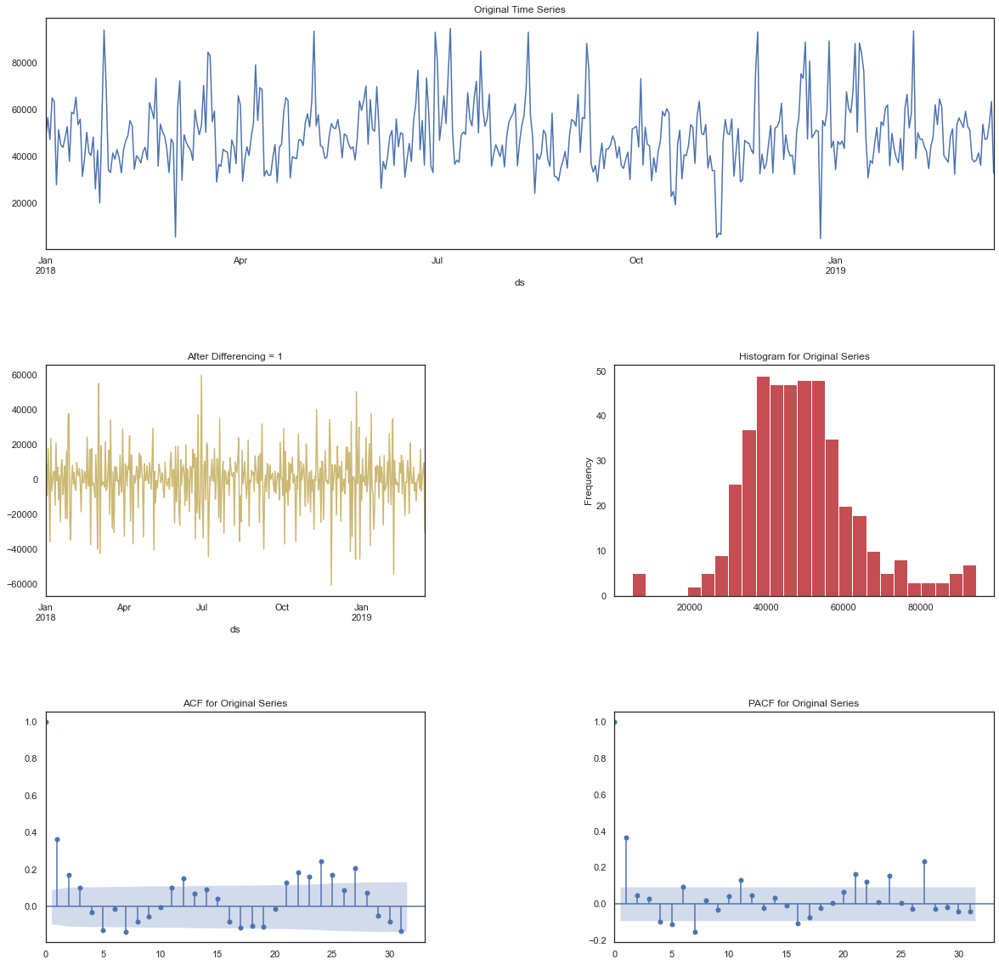

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10998.519, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8872.537, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8879.123, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8873.927, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8873.917, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8875.916, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.607 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

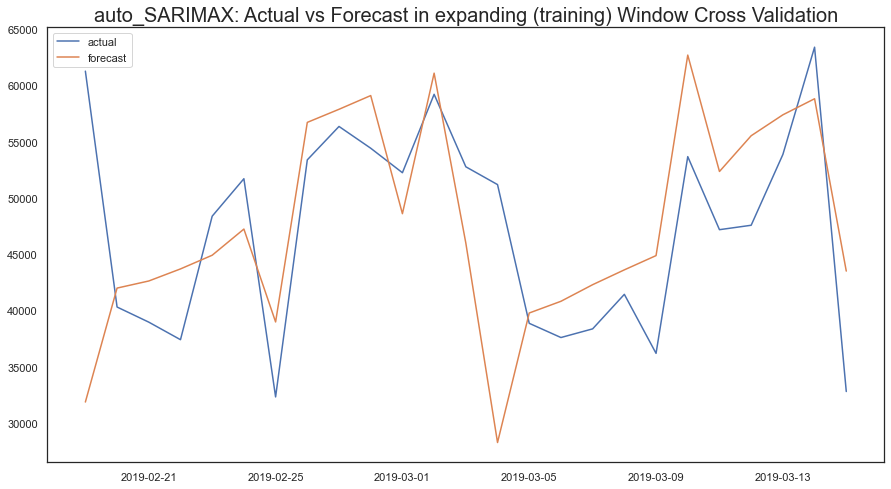

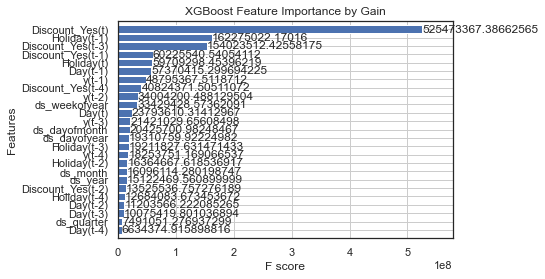

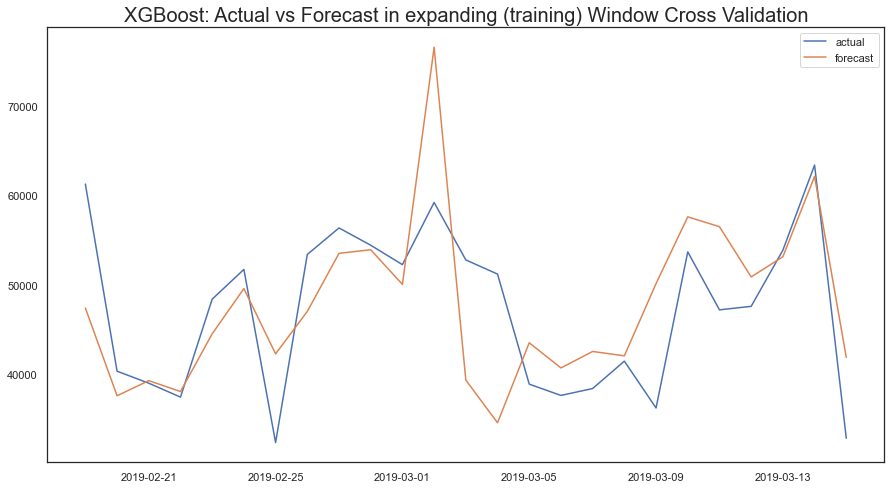

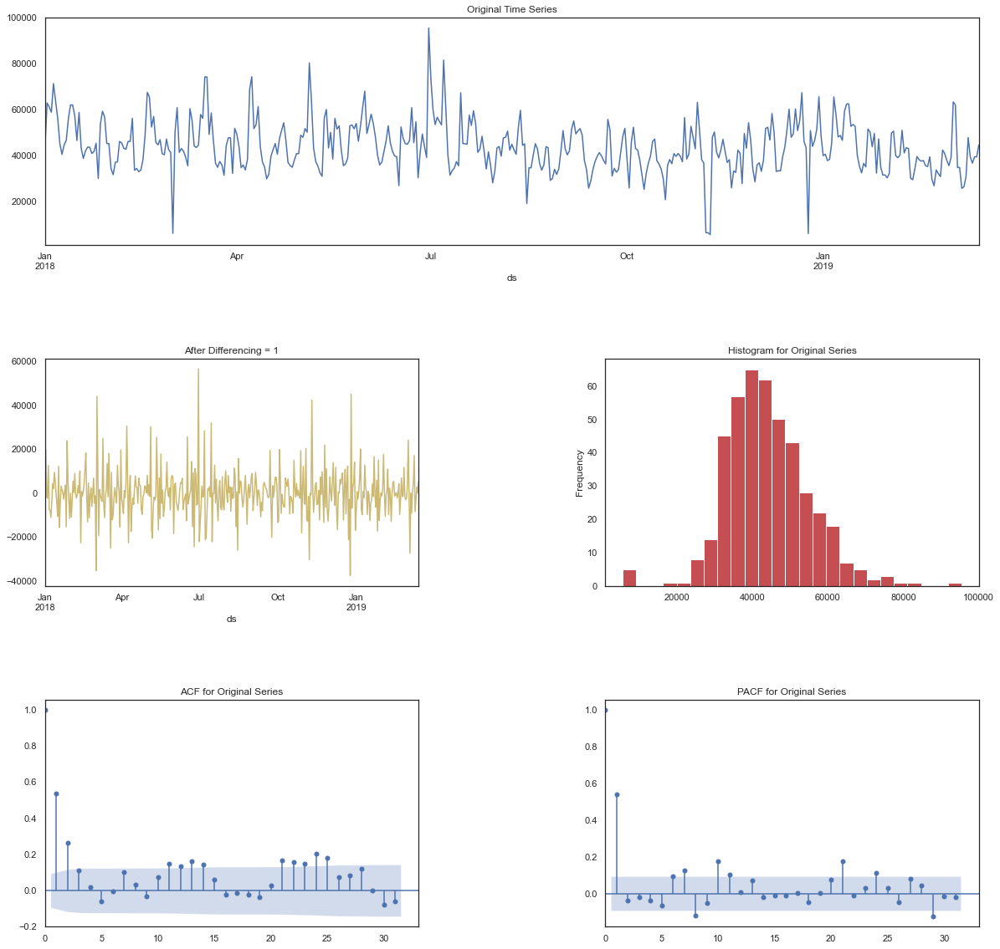

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11492.921, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=9310.059, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9328.040, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9310.910, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9311.386, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9311.000, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9275.531, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=8769.335, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9036.026, 

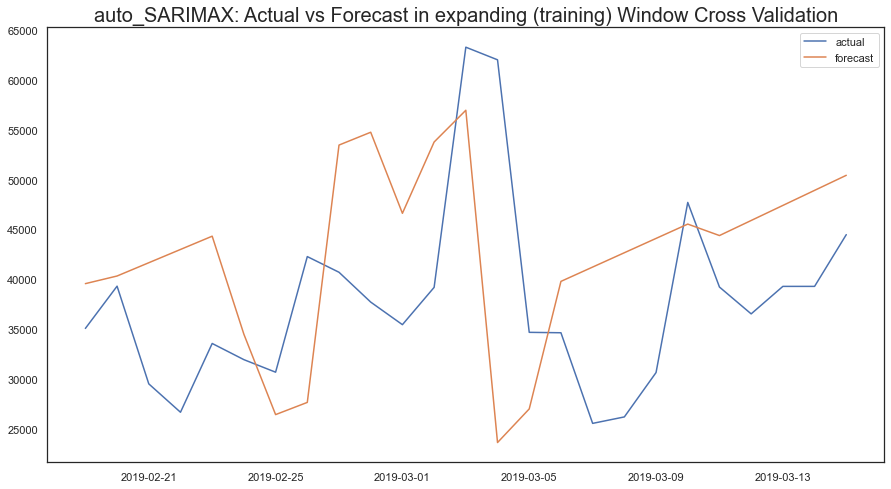

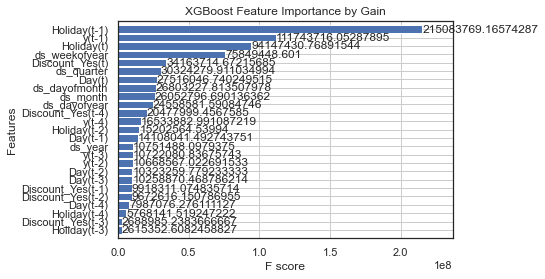

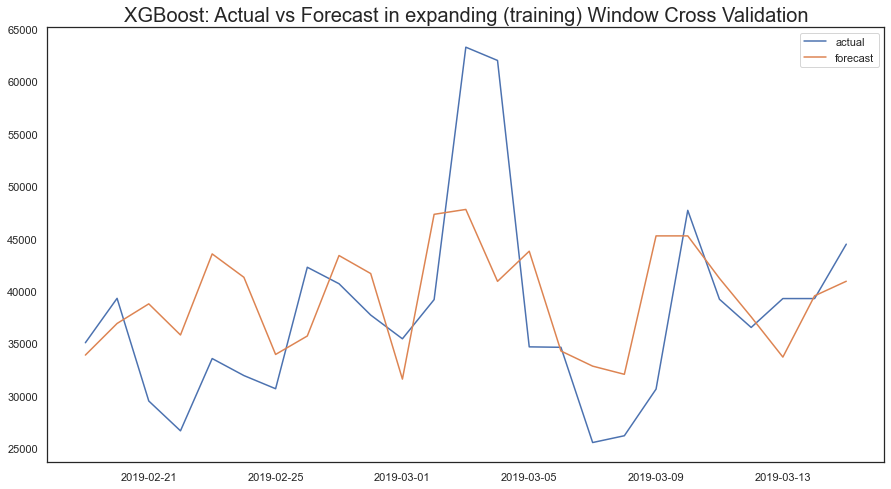

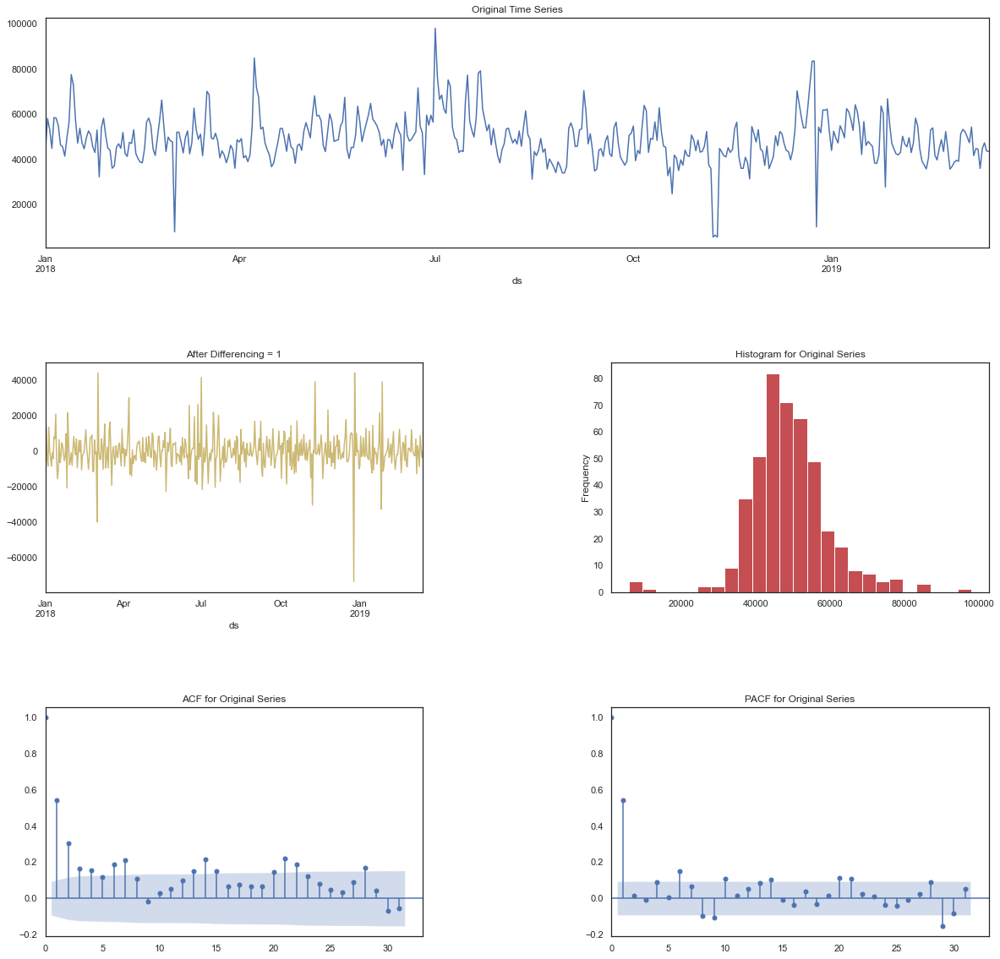

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10864.700, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8671.184, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8698.770, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8672.976, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8673.009, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8672.877, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.989 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

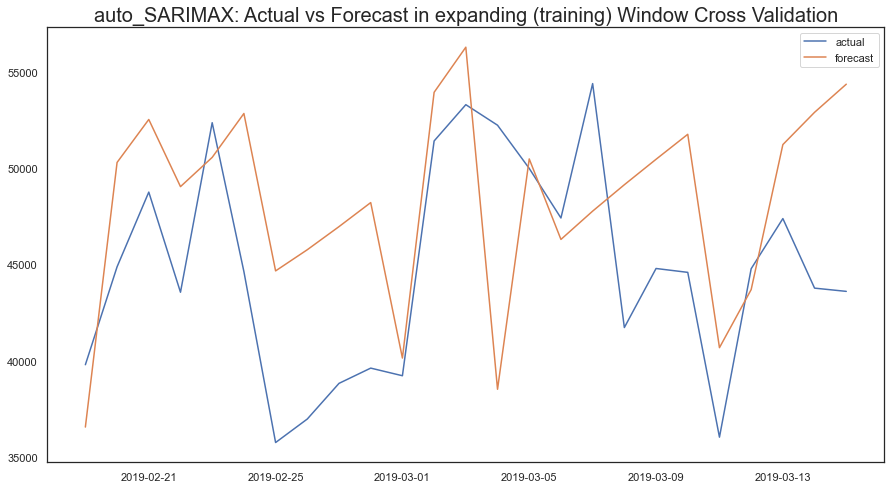

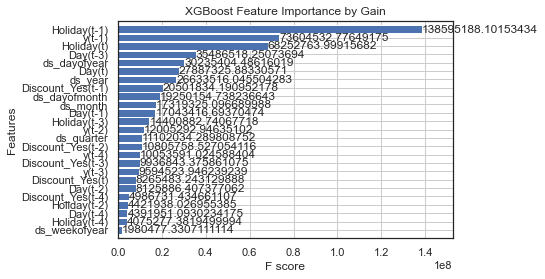

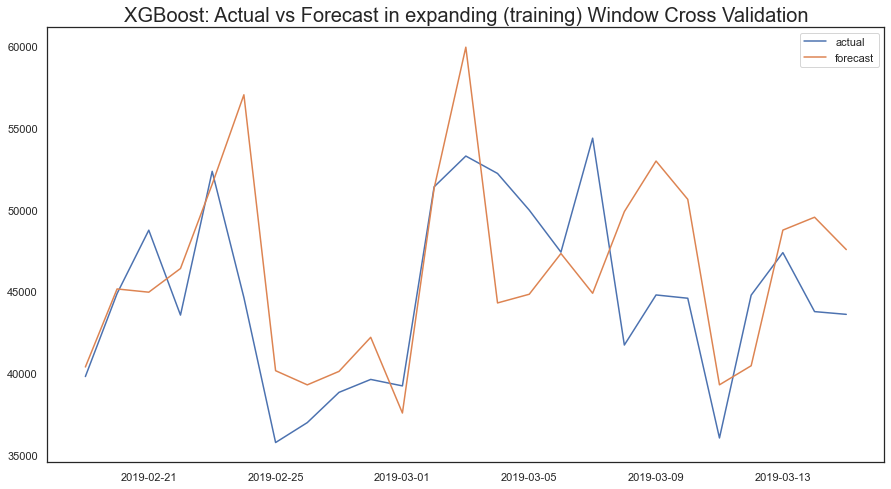

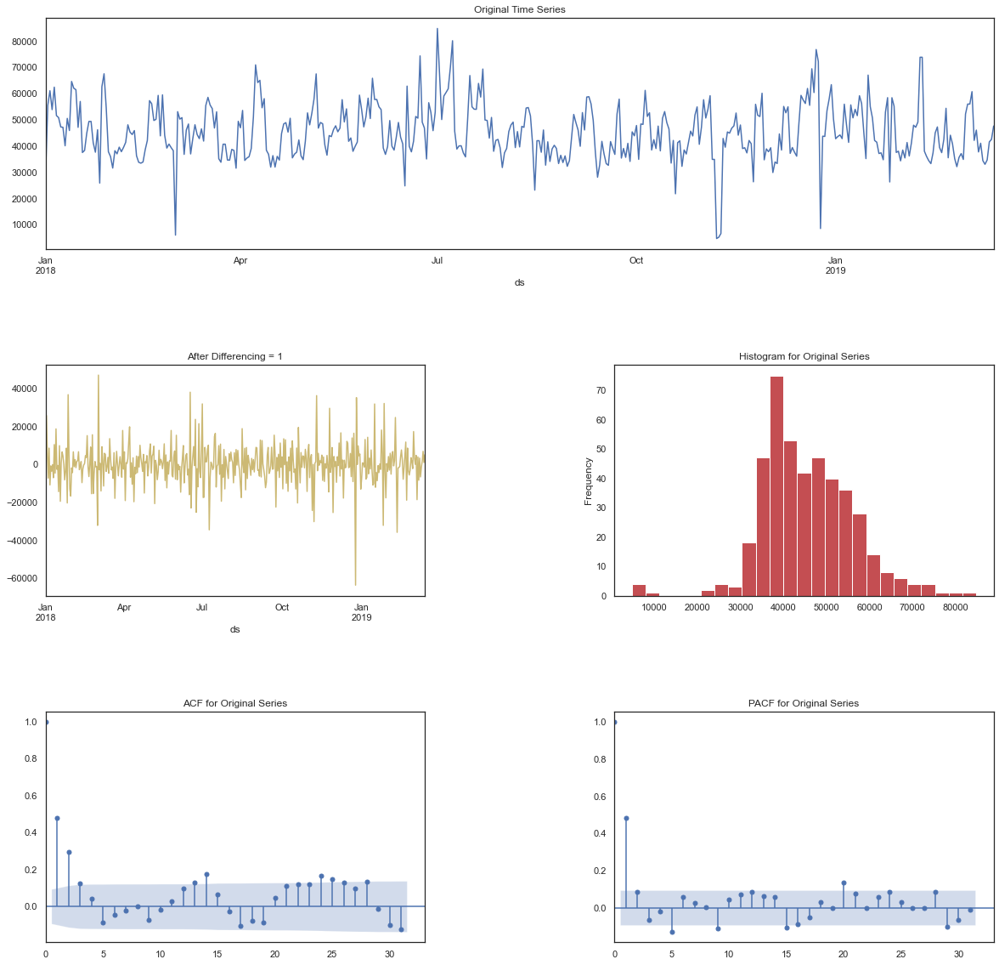

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10788.398, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8636.519, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8654.363, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8633.668, Time=0.34 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8635.494, Time=0.48 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8634.360, Time=1.29 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8633.324, Time=0.57 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8635.022, Time=0.90 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8640.709, 

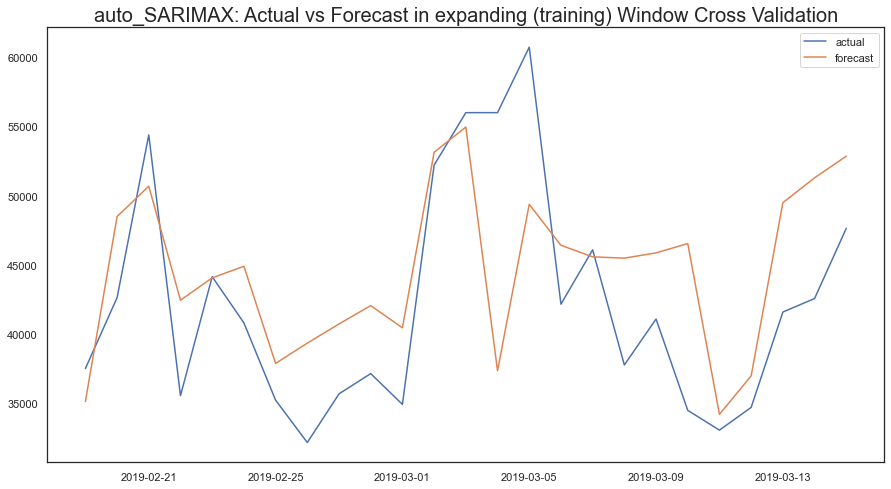

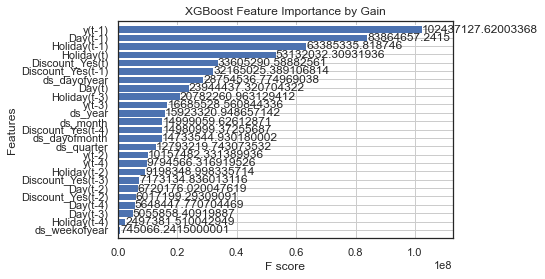

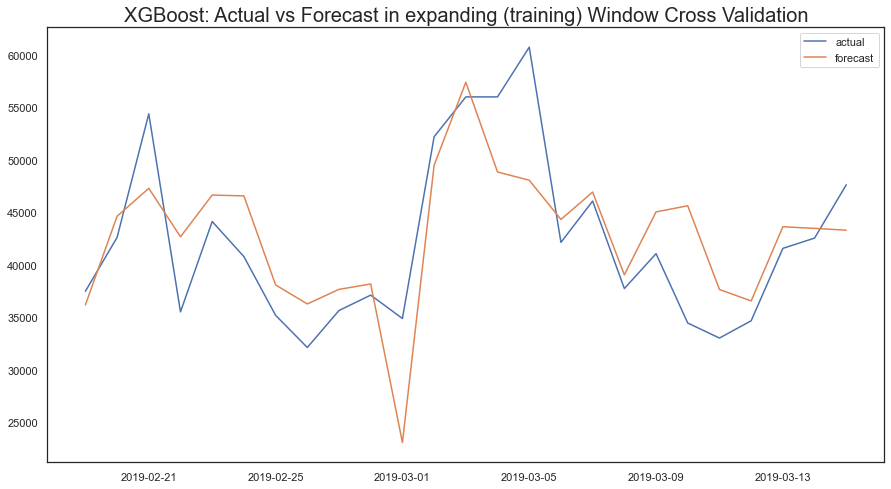

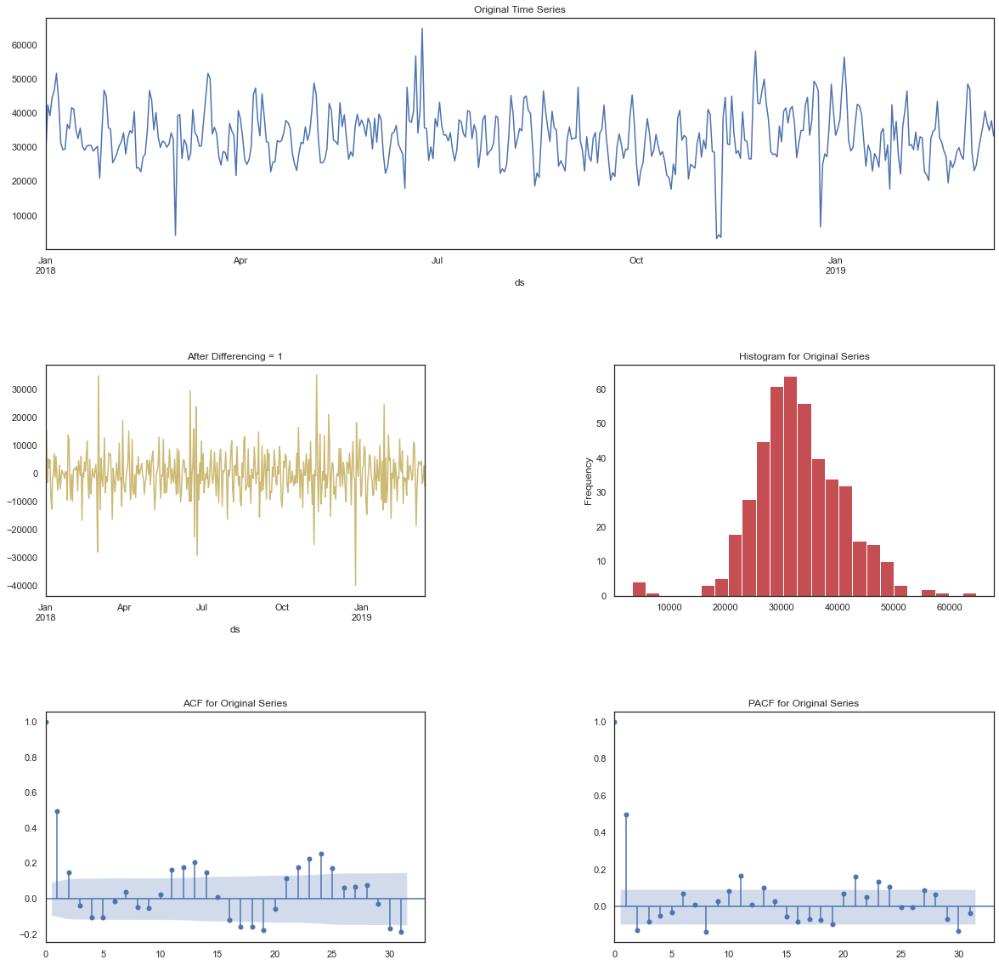

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11265.666, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8569.163, Time=3.34 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9105.213, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=3.24 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8713.345, Time=3.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9091.474, Time=1.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9054.351, Time=0.29 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 12.255 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0

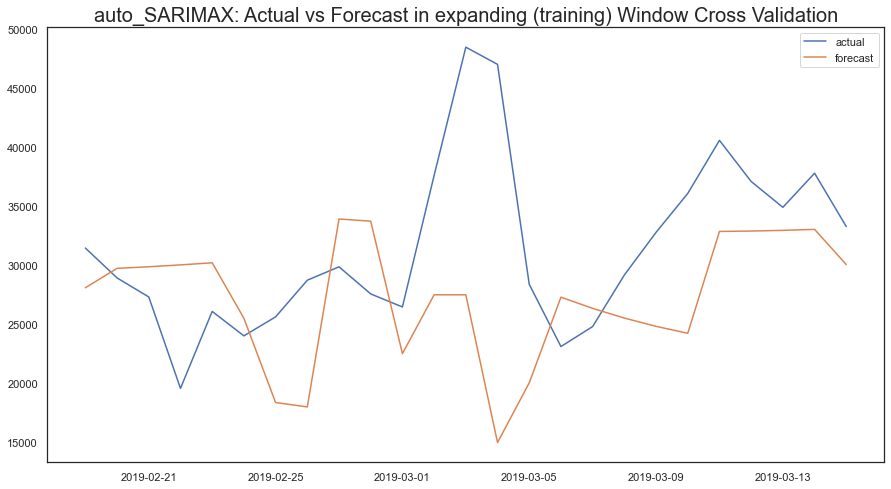

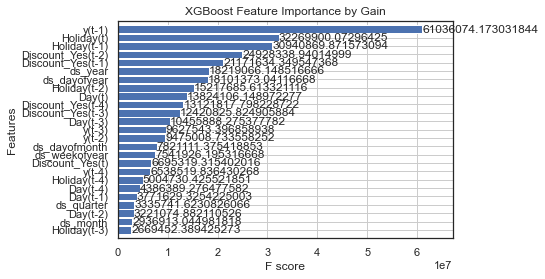

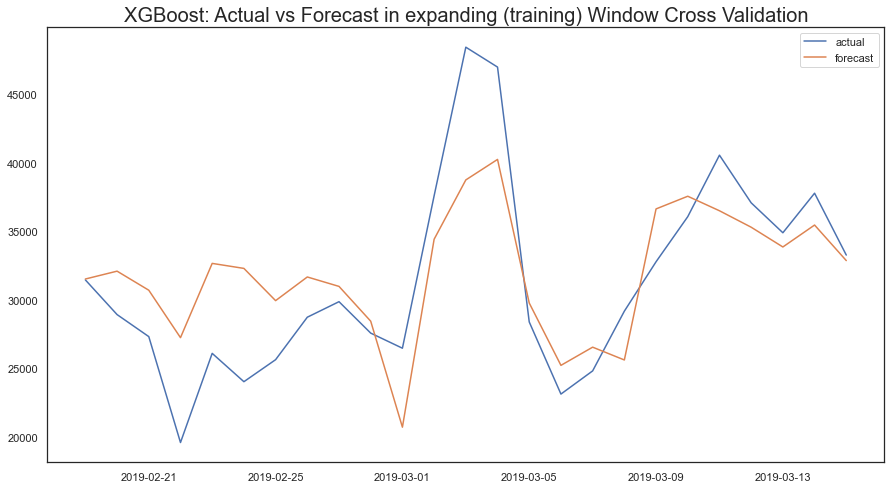

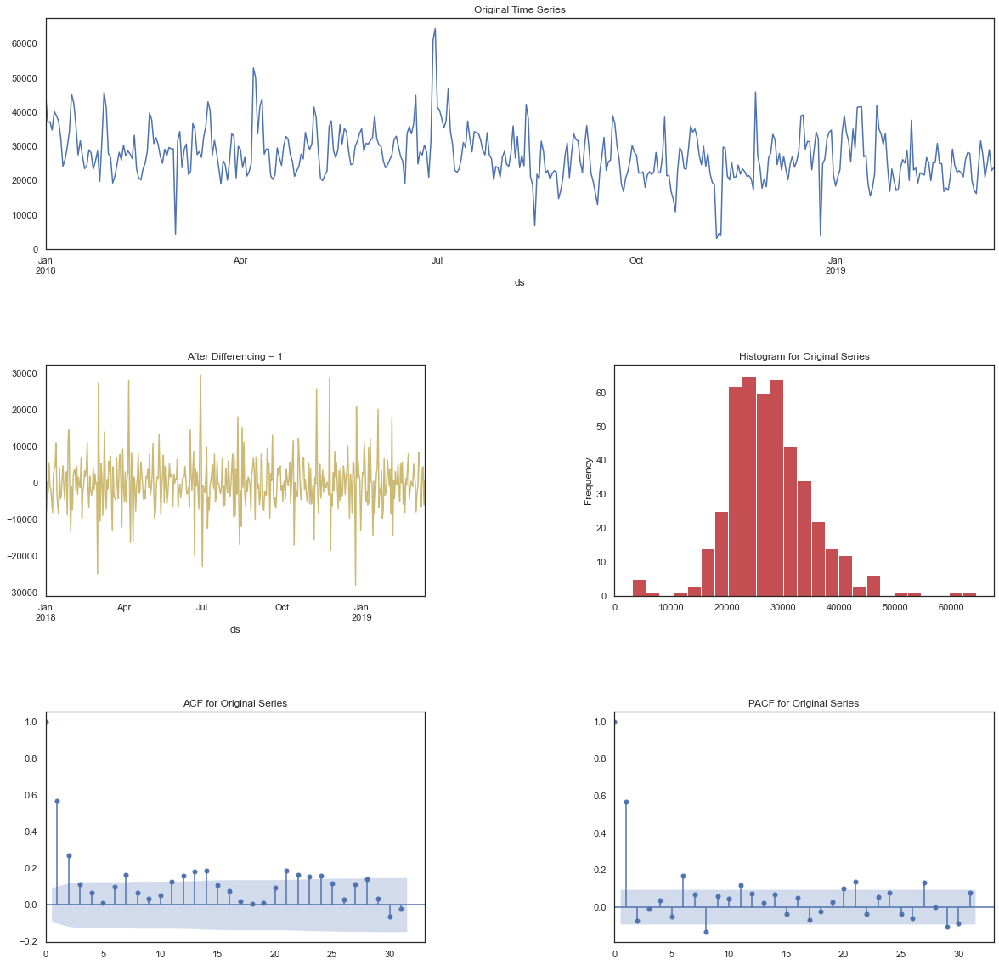

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10561.146, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8358.978, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8377.616, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8359.140, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8359.270, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8361.099, Time=0.82 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 2.555 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

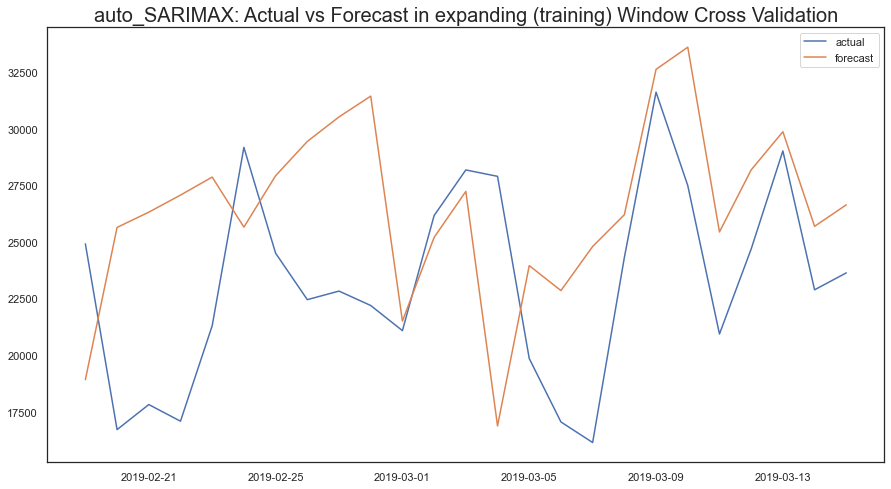

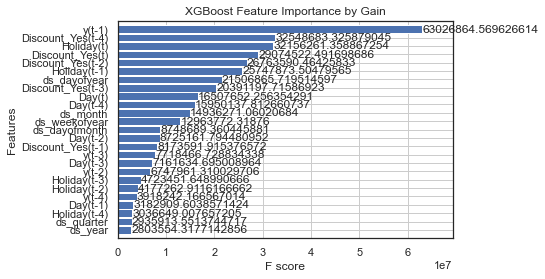

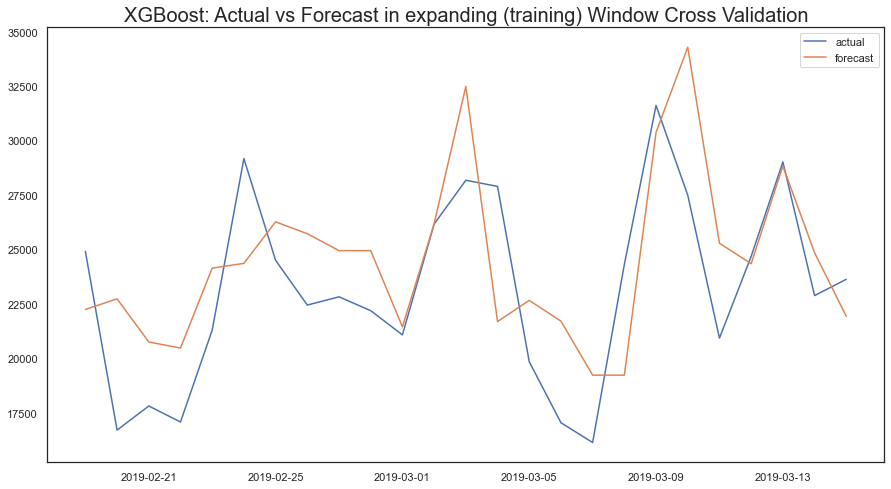

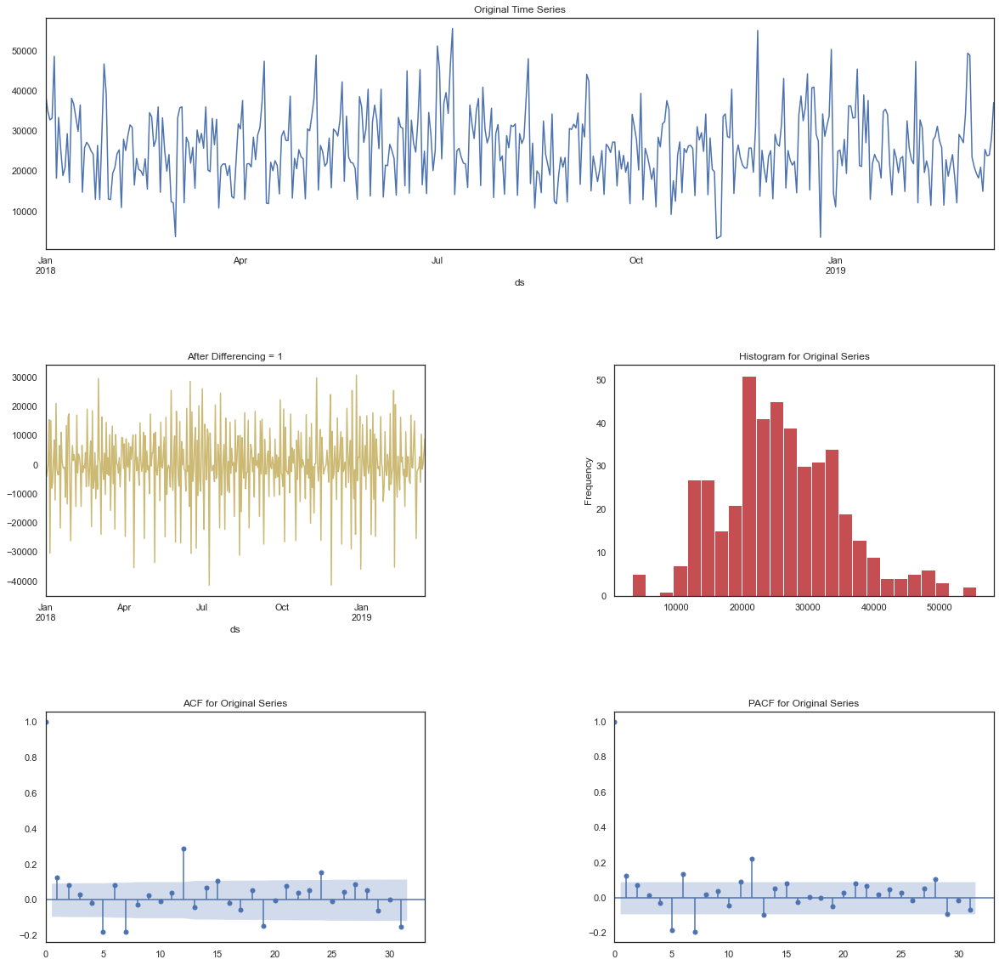

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10560.179, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8478.572, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8478.890, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8475.673, Time=0.36 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8474.822, Time=0.40 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8476.760, Time=1.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8475.400, Time=1.07 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(3,0,0)(0,0,0)[0]          
Total fit t

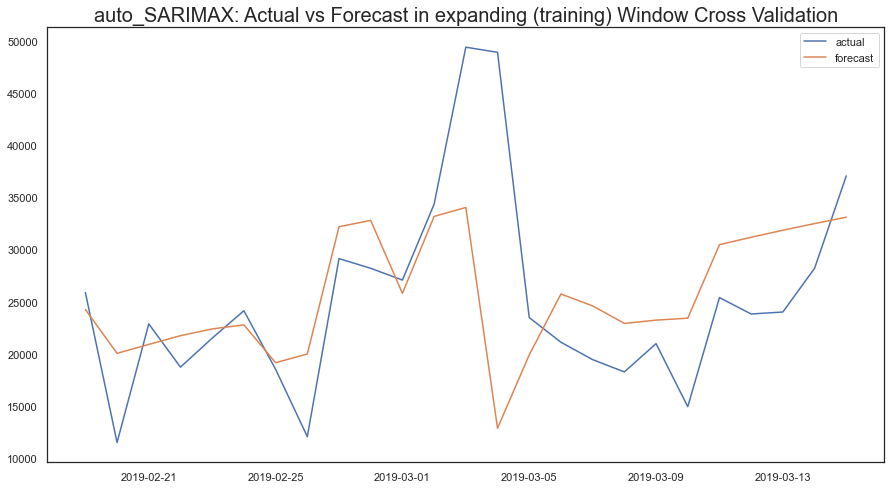

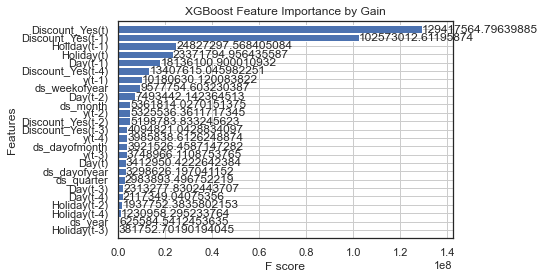

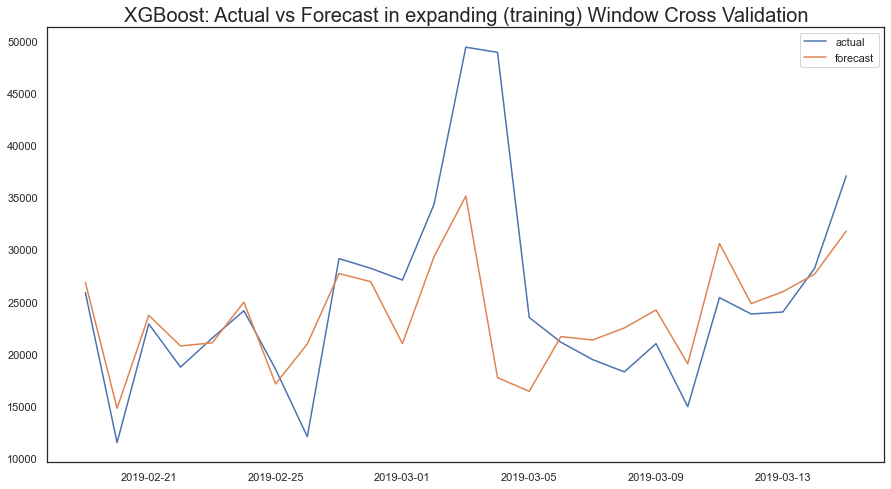

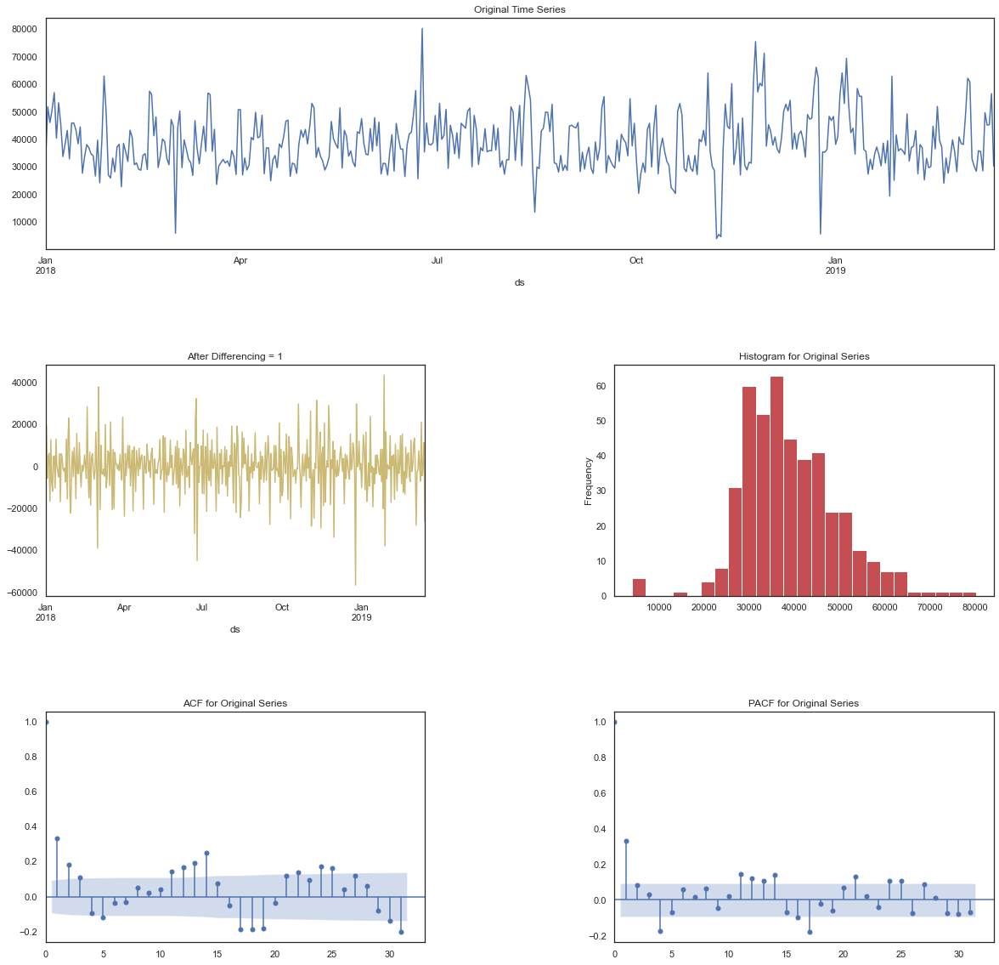

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11361.214, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8743.695, Time=3.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9184.727, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9158.949, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9159.148, Time=0.52 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9161.379, Time=1.27 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8881.992, Time=1.37 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 7.236 seconds

Best model is a Seasonal SARIMAX(1,0,0)*

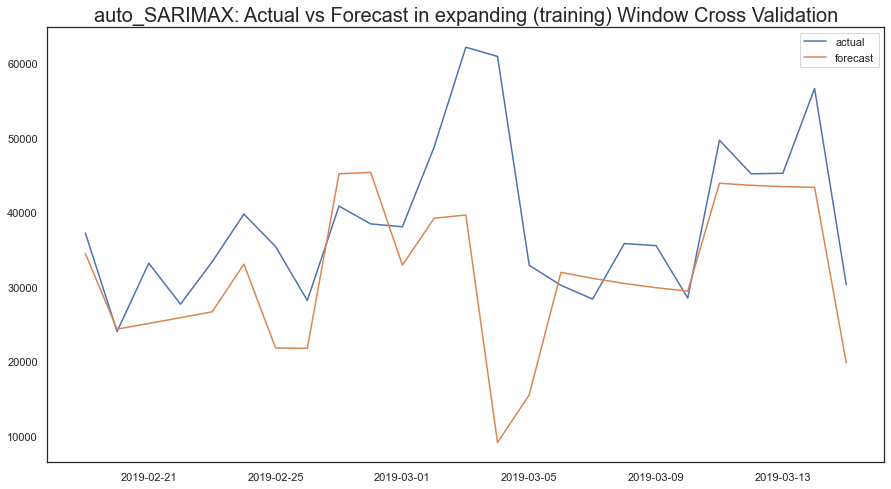

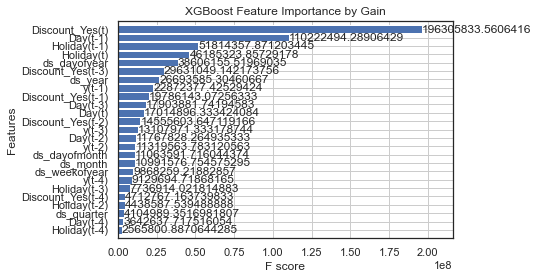

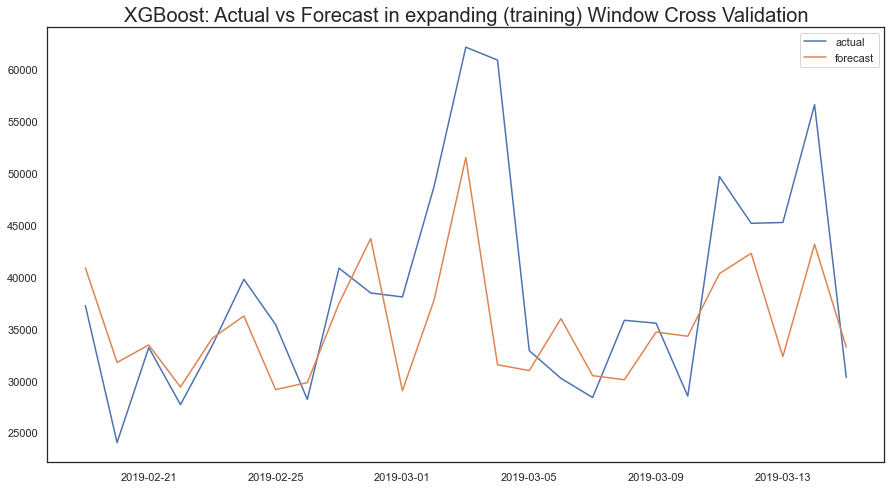

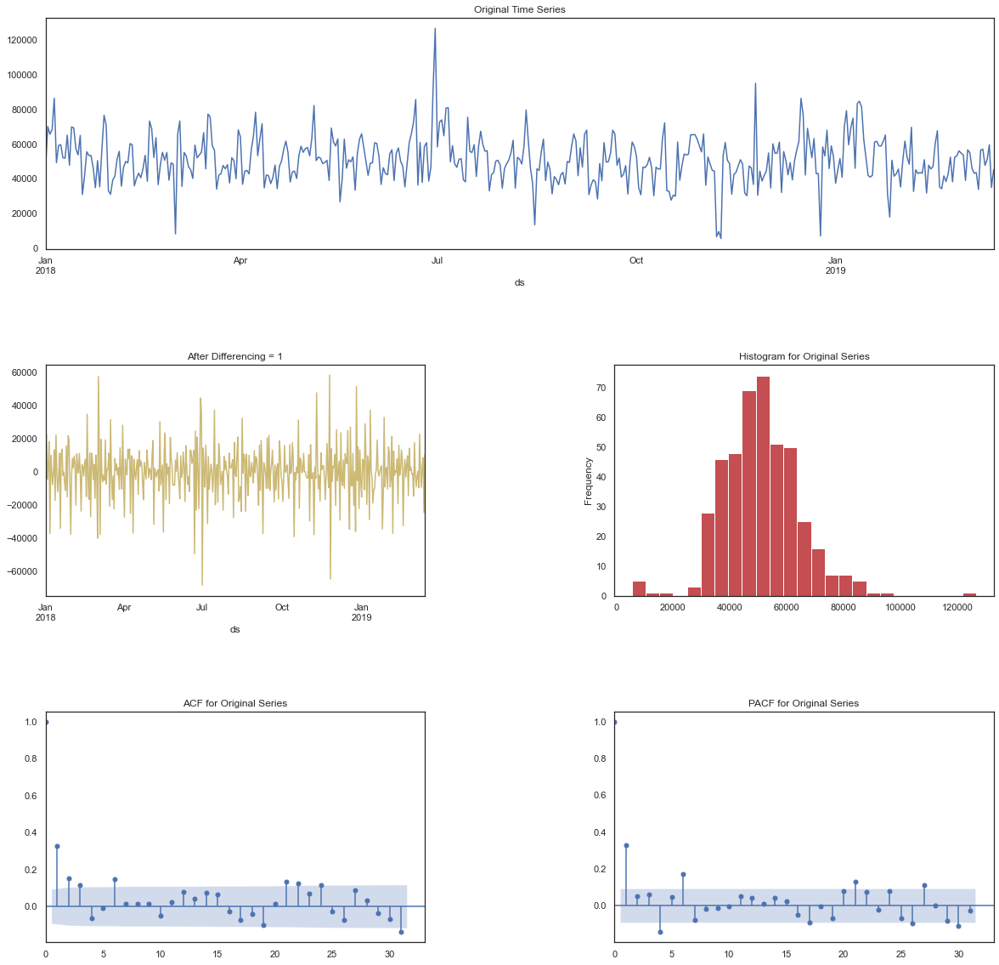

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11003.165, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8883.616, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8890.915, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8881.860, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8882.129, Time=0.41 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8879.148, Time=0.89 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8880.263, Time=0.57 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8882.163, Time=1.16 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8881.302, 

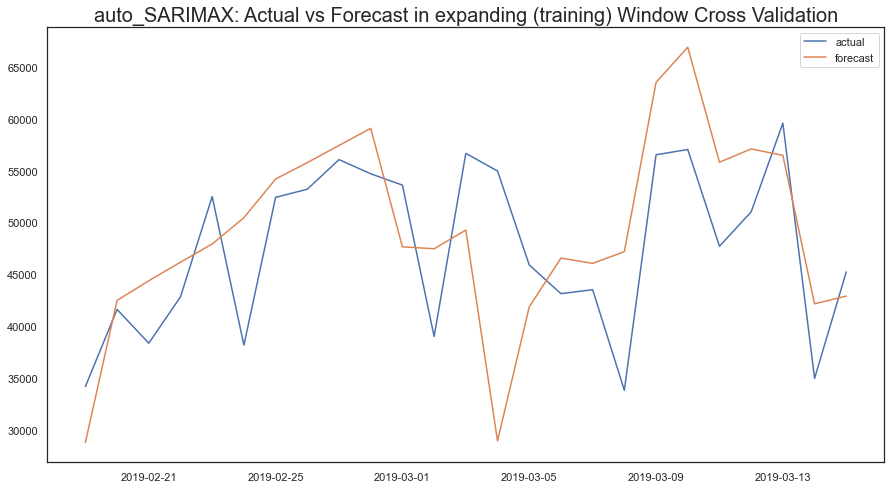

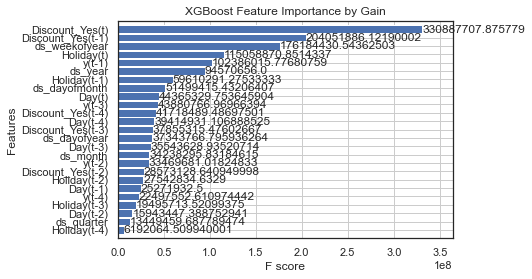

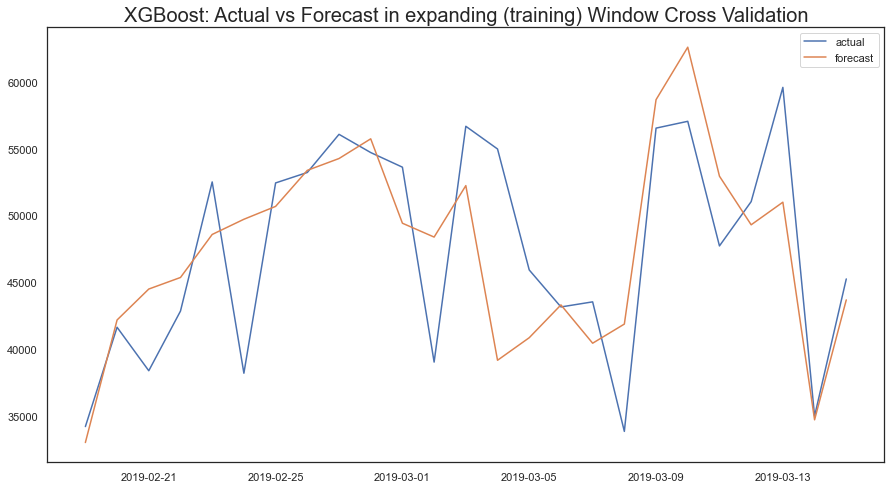

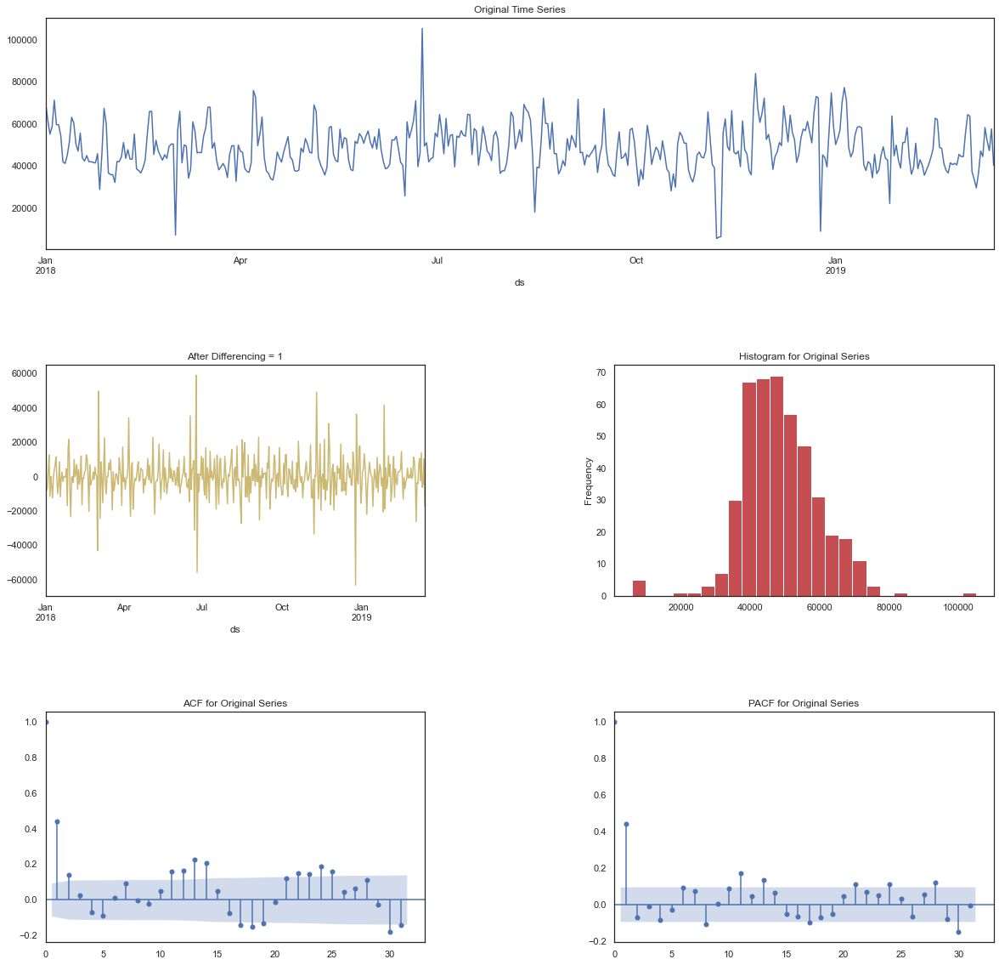

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10863.649, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8735.733, Time=0.57 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8739.100, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8737.476, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8737.477, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8739.392, Time=1.23 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 3.218 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

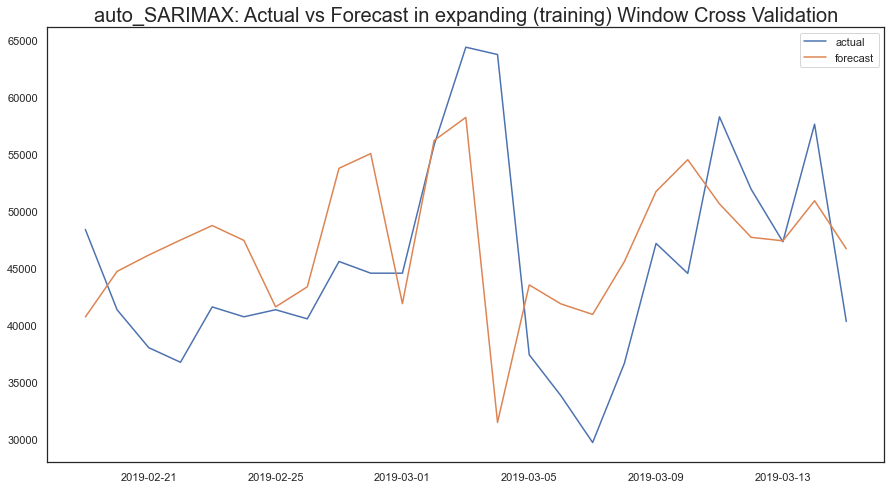

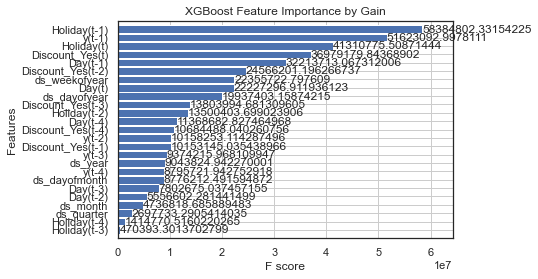

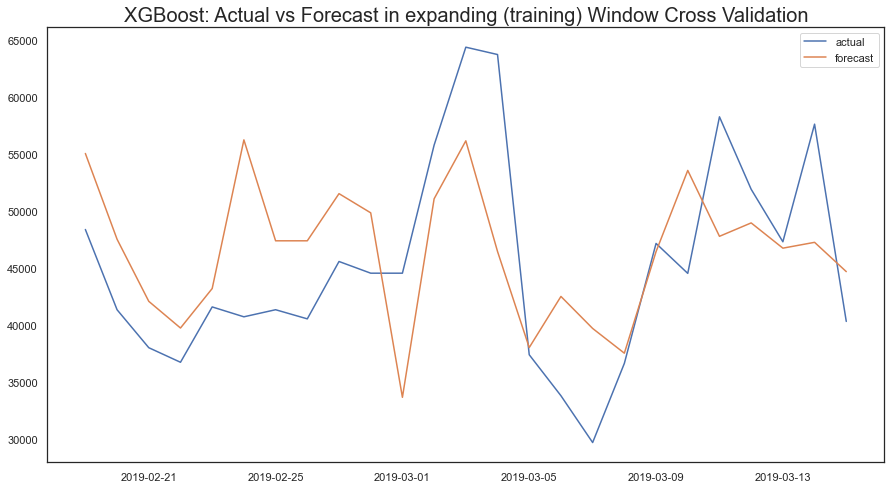

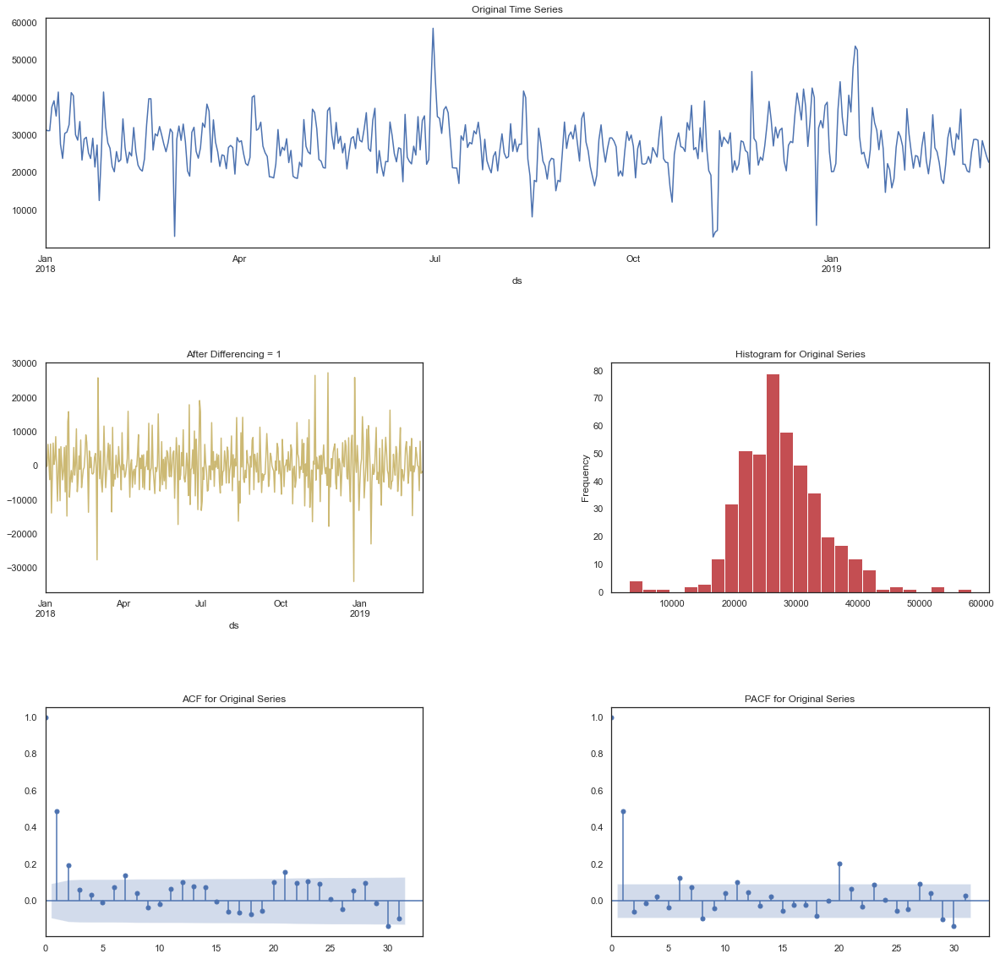

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10509.311, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8329.986, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8342.806, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8330.671, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8330.842, Time=0.44 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8332.626, Time=1.14 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 2.632 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0,0

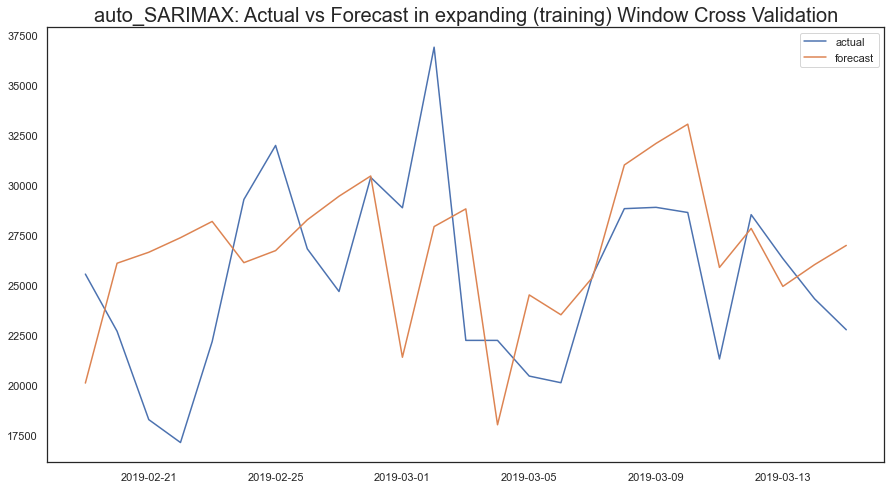

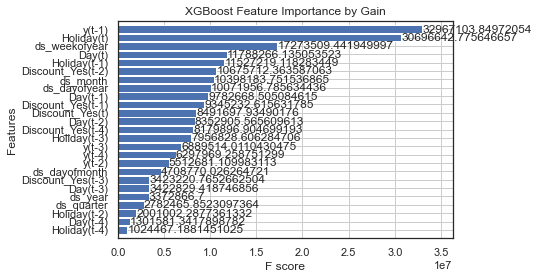

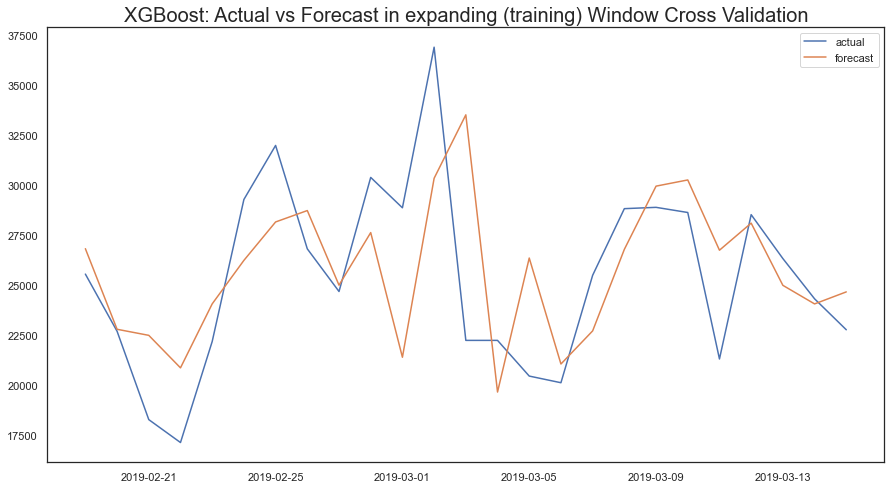

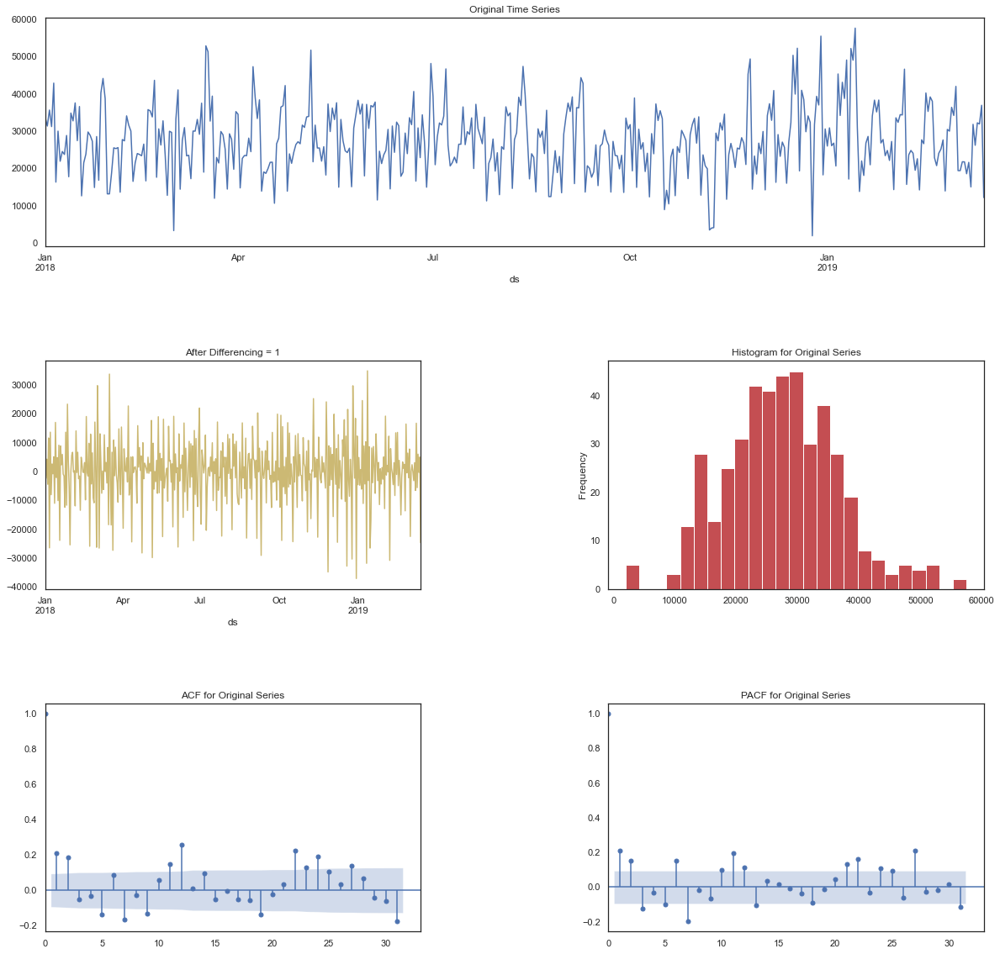

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10593.235, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8497.125, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8501.595, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8488.578, Time=0.36 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8485.911, Time=0.43 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8482.719, Time=1.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8481.337, Time=0.83 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8493.692, Time=0.77 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8482.865, 

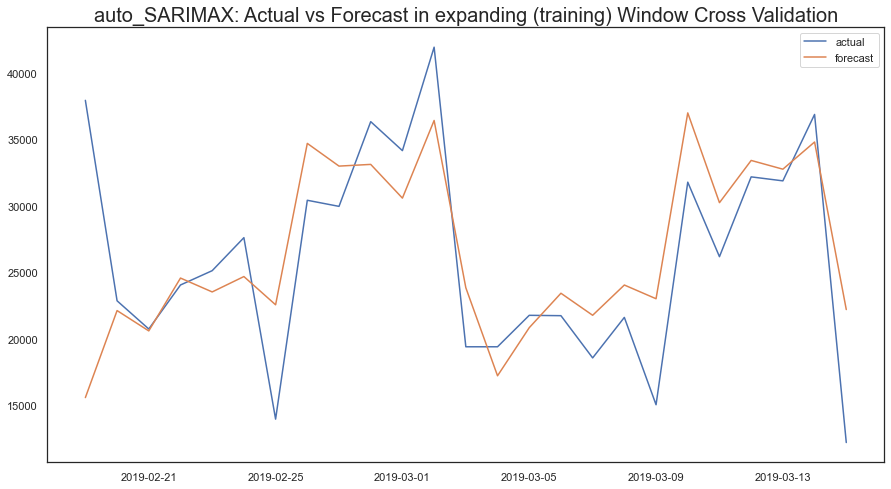

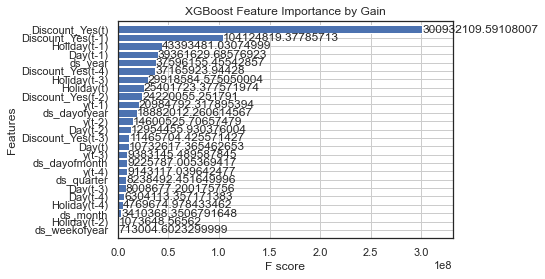

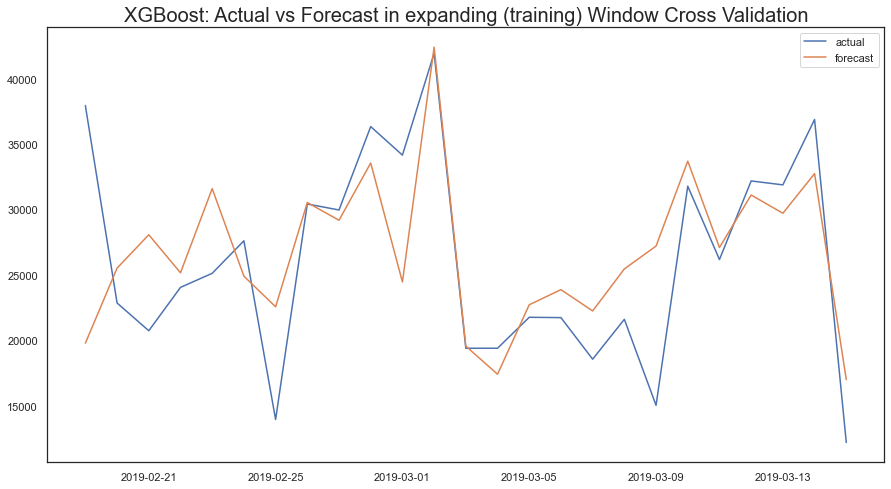

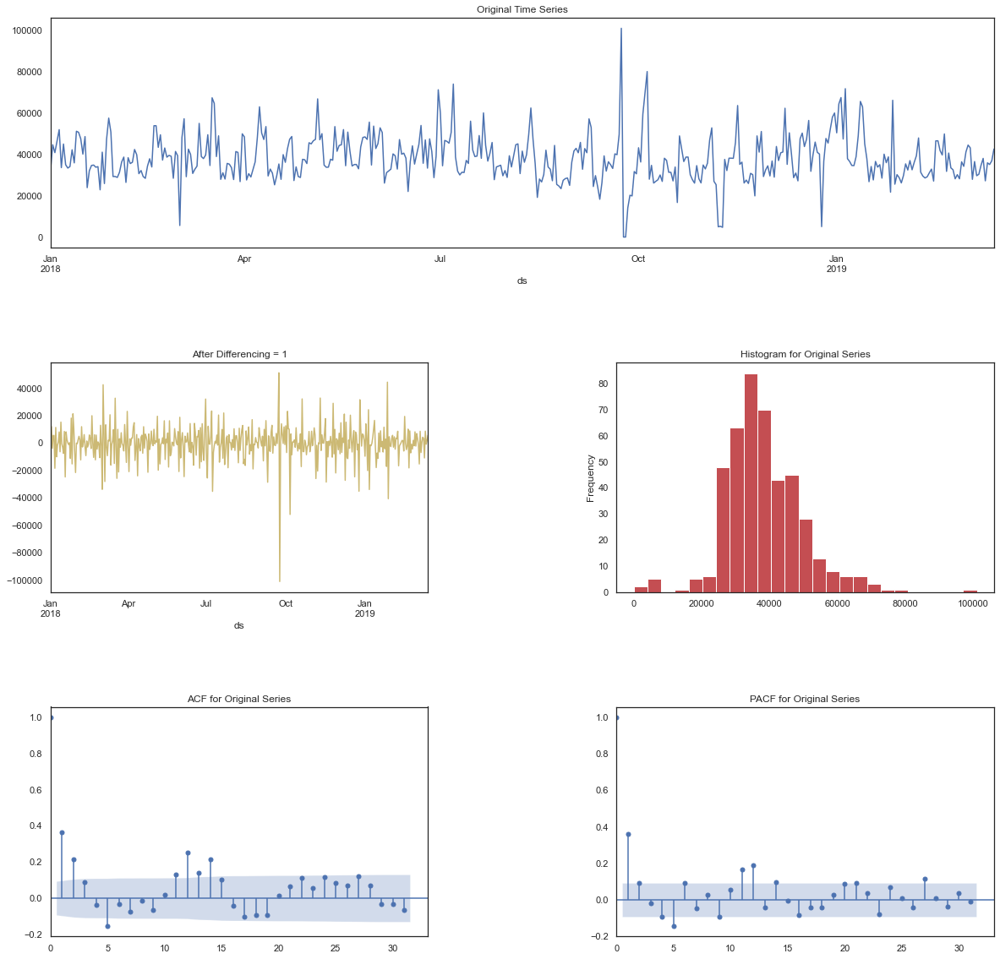

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10826.499, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8703.494, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8713.553, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8700.926, Time=0.36 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8702.235, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8702.454, Time=0.81 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8702.060, Time=0.60 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8704.206, Time=1.20 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=

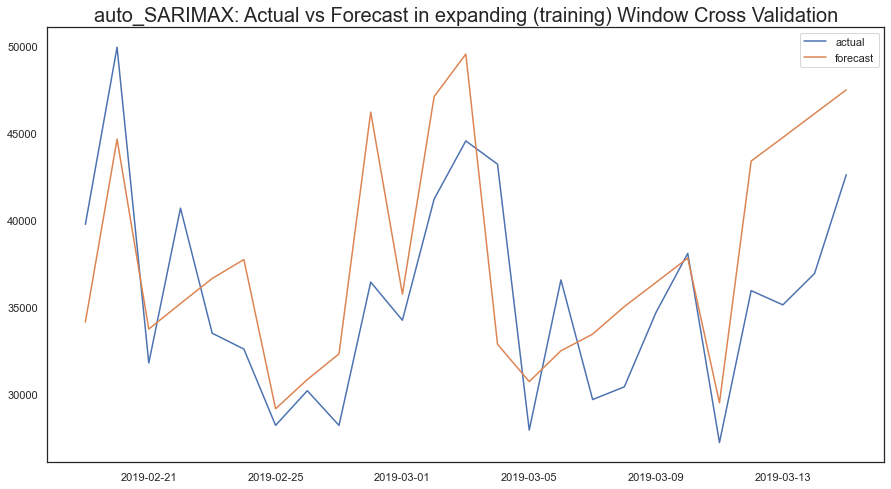

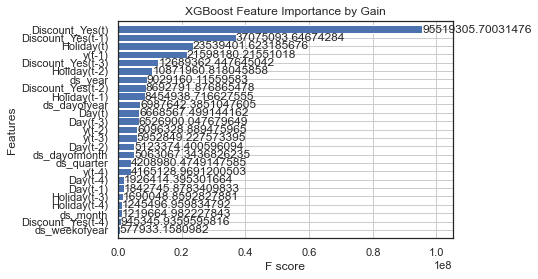

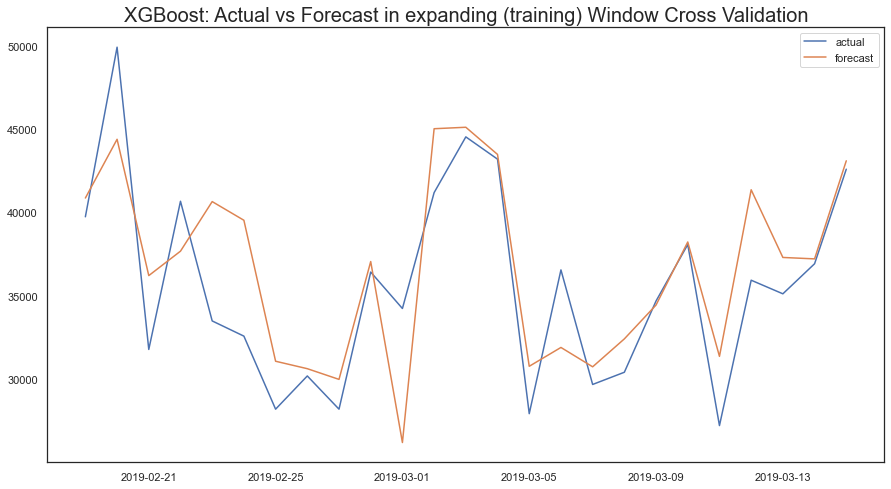

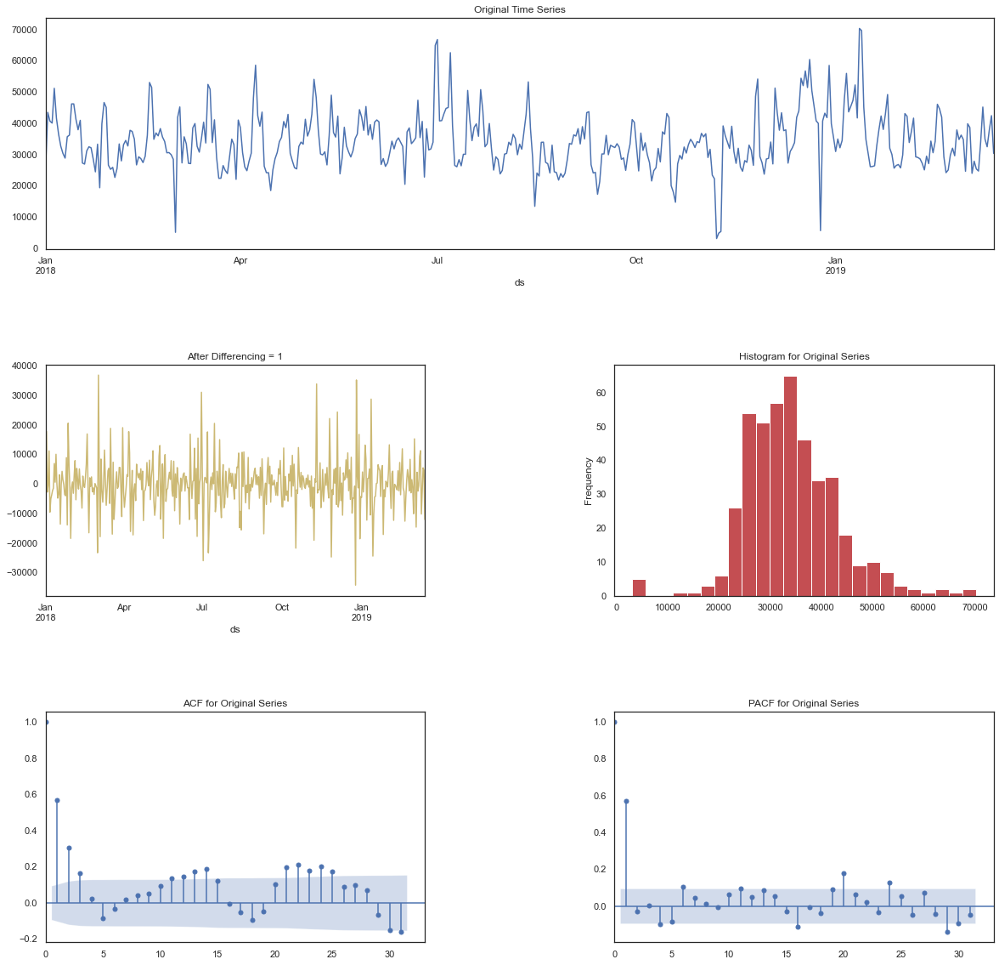

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11269.918, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8547.323, Time=3.96 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9096.821, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9073.979, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9074.224, Time=0.53 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=5.40 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8804.719, Time=1.44 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 12.275 seconds

Best model is a Seasonal SARIMAX(1,0,0)*(0,0

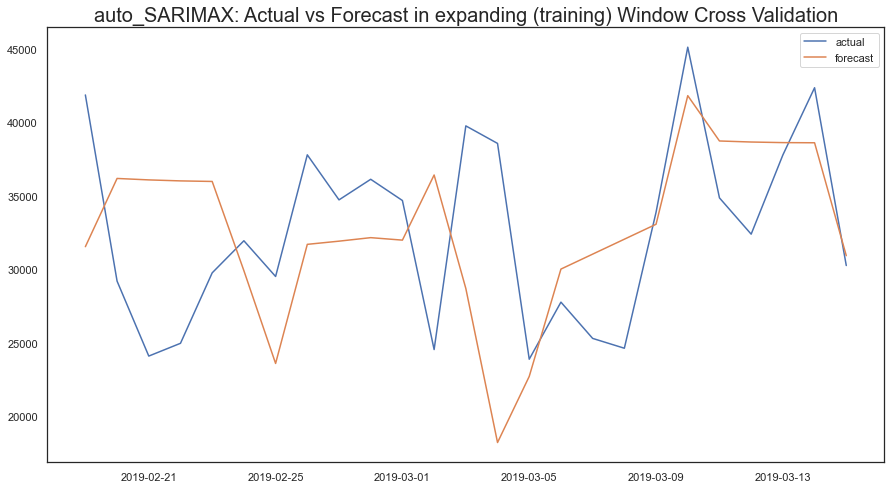

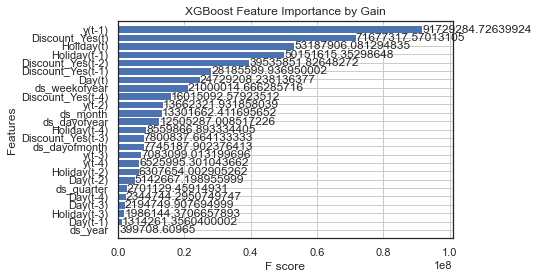

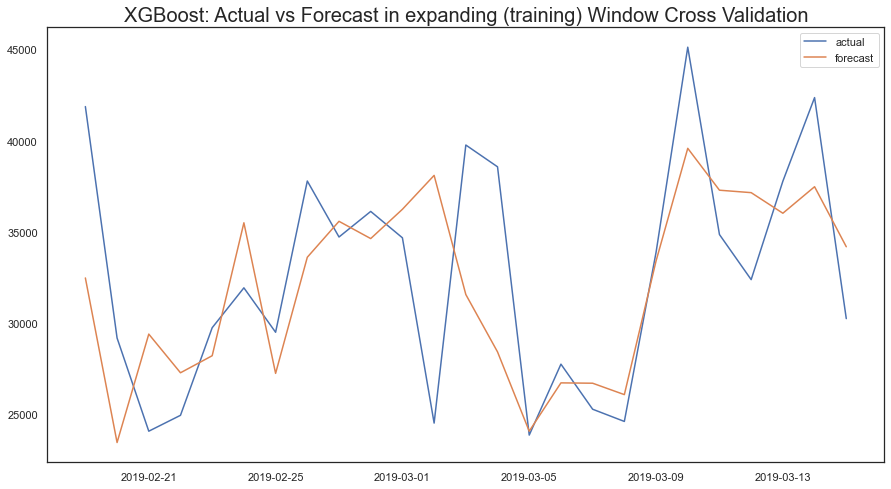

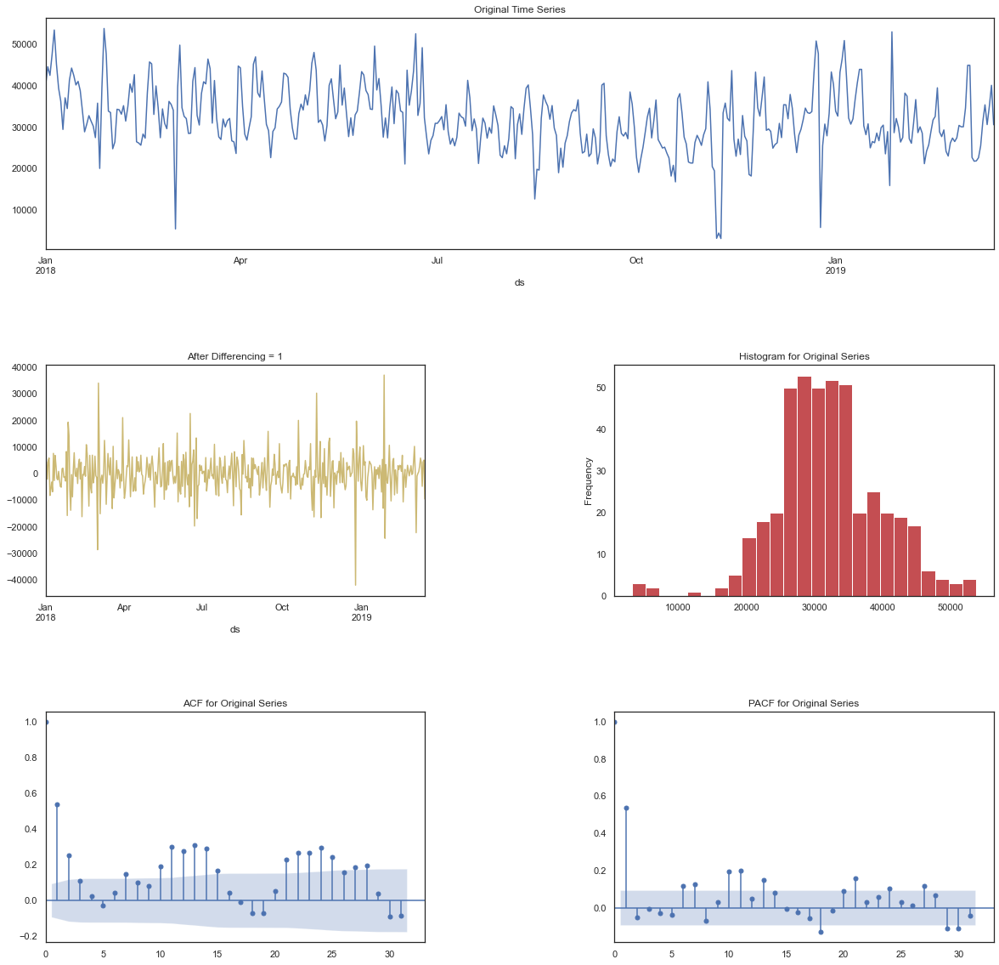

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10529.095, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8368.432, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8388.755, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8367.499, Time=0.36 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8369.238, Time=0.47 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8368.889, Time=0.83 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8367.509, Time=0.62 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8370.864, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=

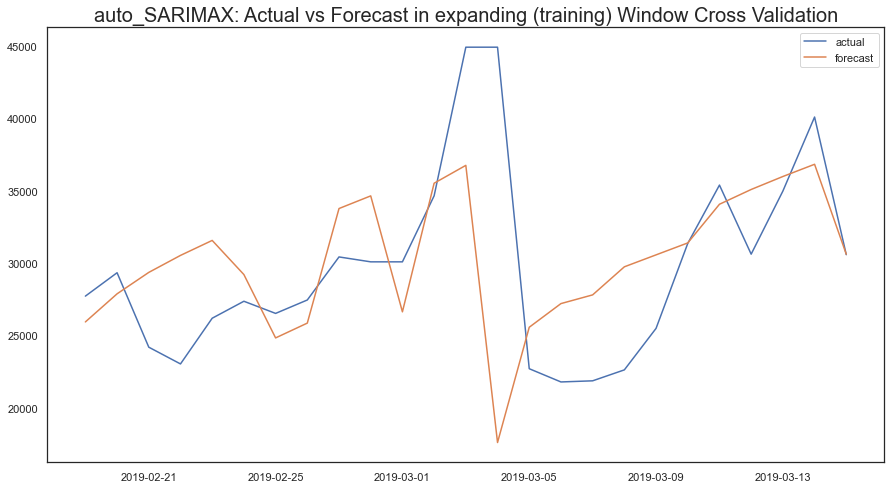

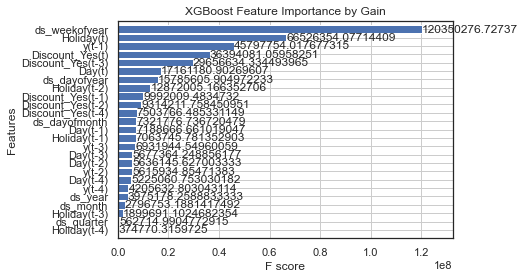

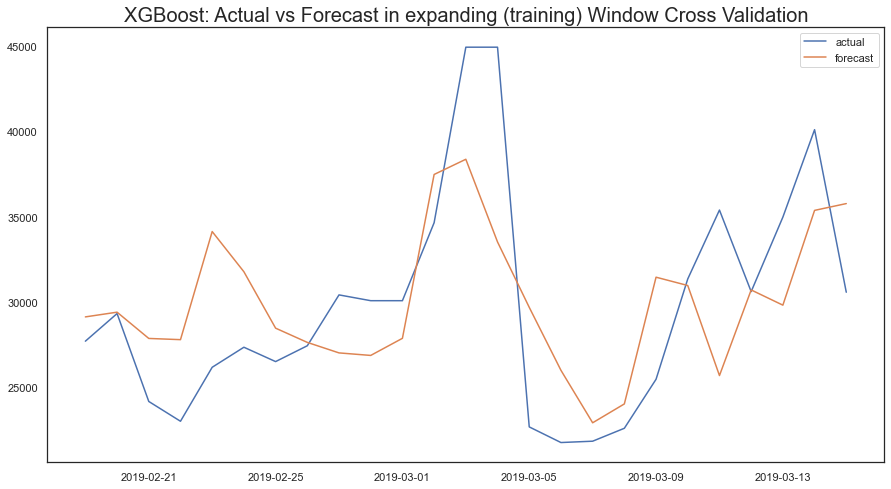

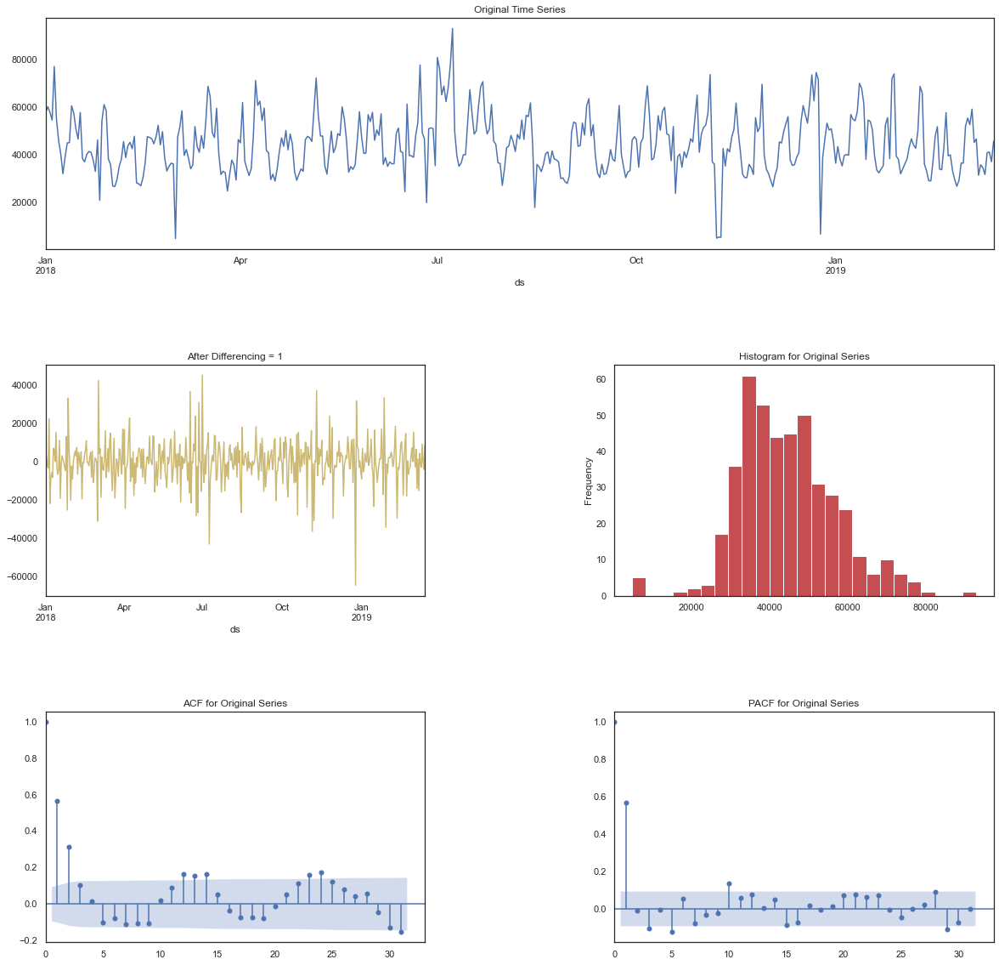

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 414 Test Shape: 5

    Finding the best parameters using AutoArima:
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10929.602, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8755.211, Time=0.25 sec


In [ ]:
from auto_ts import auto_timeseries
models={}
for i in dat:
    model=auto_timeseries(score_type='msle', time_interval='D', seasonality=False, model_type=['stats', 'ARIMA', 'SARIMAX', 'VAR', 'ML'], verbose=2)
    model.fit(dat[i].drop("Store_id",axis=1),ts_column='ds',target='y',cv=5)
    models[i]=model

In [ ]:
import pickle
with open('models.pkl','wb') as model_Seasonality_True:
  pickle.dump(models,model_Seasonality_True)

In [ ]:
models1={}
for i in dat:
    model=auto_timeseries( score_type='MSLE', time_interval='D', seasonality=False, seasonal_period=12, model_type=['best'], verbose=2)
    model.fit(dat[i].drop("Store_id",axis=1),ts_column='ds',target='y',cv=5)
    models1[i]=model

In [ ]:
import pickle
with open('models1.pkl','wb') as model_Seasonality_False:
  pickle.dump(models1,model_Seasonality_False)

In [ ]:
result1={}
for i in dat_test:
    result1[i]=models1[i].predict(dat_test[i].drop("Store_id",axis=1))

In [ ]:
dataFrame=pd.DataFrame()
dataFrame2=pd.DataFrame()
for i in dat_test:
    dataFrame=pd.concat([dataFrame,dat_test[i]])
for j in result1:
    result1[j]["Store_id"]=int(j)
    dataFrame2=pd.concat([dataFrame2,result1[j]]) 
dataFrame2=dataFrame2[["ds","Store_id","yhat"]]
dataFrame=dataFrame[['ds','Store_id']]
final=dataFrame2.merge(dataFrame,on=['ds','Store_id'])
nav=X_test[['ds','Store_id','y']]
final=final.merge(nav,on=['ds','Store_id'])
one=final[final['yhat']>0]

In [ ]:
print(mean_squared_log_error(one['y'],one['yhat'])*1000)